In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import torch
import torch.utils.data
from scipy.io import loadmat
from skimage import io
import spectral

In [2]:
from scipy.io import loadmat, whosmat

# Inspect the contents of the .mat file
mat_contents_img = whosmat(r"C:\Users\ursti\Downloads\GAN\Datasets\Salinas\Salinas_corrected.mat")
mat_contents_gt = whosmat(r"C:\Users\ursti\Downloads\GAN\Datasets\Salinas\Salinas_gt.mat")

print(mat_contents_img)
print(mat_contents_gt)

[('salinas_corrected', (512, 217, 204), 'double')]
[('salinas_gt', (512, 217), 'double')]


In [3]:
img = loadmat(r"C:\Users\ursti\Downloads\GAN\Datasets\Salinas\Salinas_corrected.mat")['salinas_corrected']
gt = loadmat(r"C:\Users\ursti\Downloads\GAN\Datasets\Salinas\Salinas_gt.mat")['salinas_gt']

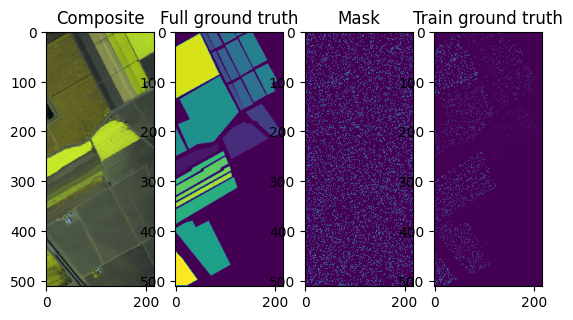

In [4]:
mask = np.random.randint(0, 100, gt.shape) < 5
train_gt = np.copy(gt)
train_gt[np.nonzero(~mask)] = 0
test_gt = np.copy(gt)
test_gt[train_gt > 0] = 0

rgb = img[:,:,(55,41,12)]
rgb = (255 * (rgb.astype(np.float32) - rgb.min())/(rgb.max() - rgb.min())).astype(np.uint8)
fig = plt.figure()
fig.add_subplot(141)
plt.imshow(rgb)
plt.title("Composite")
fig.add_subplot(142)
plt.imshow(gt)
plt.title("Full ground truth")
fig.add_subplot(143)
plt.imshow(mask)
plt.title("Mask")
fig.add_subplot(144)
plt.imshow(train_gt)
plt.title("Train ground truth")
plt.show()

In [5]:
from skimage import morphology

class HyperX(torch.utils.data.Dataset):
    
    def __init__(self, data, ground_truth, semi=False):
        super(HyperX, self).__init__()
        # Normalize the data in [0,1]
        data = (data - data.min()) / (data.max() - data.min())
        self.data = data
        self.gt = ground_truth
        self.n_classes = len(np.unique(ground_truth))
        if semi:
            # Semi-supervision, include neighbours at 50px
            x_pos, y_pos = np.nonzero(morphology.dilation(ground_truth > 0, morphology.disk(50)))
        else:
            x_pos, y_pos = np.nonzero(ground_truth)
        self.indices = [idx for idx in zip(x_pos, y_pos)]
    
    def __len__(self):
        return len(self.indices)
    
    def __getitem__(self, i):
        x, y = self.indices[i]
        data = self.data[x,y]
        # Get the label in one-hot encoded style
        label = np.asarray(np.eye(self.n_classes)[self.gt[x, y]], dtype='int64')
        return torch.from_numpy(data), torch.from_numpy(label)

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm

        
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.generator = nn.Sequential(
            nn.Linear(z_dim + c_dim, h_dim),
            nn.SELU(),
            nn.Linear(h_dim, h_dim),
            nn.SELU(),
            nn.Linear(h_dim, h_dim),
            nn.SELU(),
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.SELU(),               # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.SELU(),               # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.SELU(),               # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.SELU(),               # Additional activation
            nn.Linear(h_dim, X_dim),
            nn.Sigmoid()
        )
        self.apply(weight_init)

    def forward(self, z, c):
        inputs = torch.cat([z, c], dim=1)
        return self.generator(inputs)
    
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.discriminator = nn.Sequential(
            nn.Linear(X_dim, h_dim),
            nn.ELU(),
            nn.Linear(h_dim, h_dim),
            nn.ELU(),
            nn.Linear(h_dim, h_dim),
            nn.ELU(),
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, 1)
        )
        self.apply(weight_init)

    def forward(self, x):
        return self.discriminator(x)
    
class Classifier(nn.Module):
    def __init__(self):
        super(Classifier, self).__init__()
        self.classifier = nn.Sequential(
            nn.Linear(X_dim, h_dim),
            nn.ELU(),
            nn.Dropout(0.5),
            nn.Linear(h_dim, h_dim),
            nn.ELU(),
            nn.BatchNorm1d(h_dim),
            nn.Linear(h_dim, h_dim),
            nn.ELU(),
            nn.Dropout(0.5),
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, h_dim),  # Additional layer
            nn.ELU(),                # Additional activation
            nn.Linear(h_dim, c_dim)
        )
        self.apply(weight_init)

    def forward(self, x):
        return self.classifier(x)


In [7]:
mb_size = 256 # Batch size
z_dim = 30   # Noise dimension
X_dim = img.shape[-1] # Number of bands
h_dim = 512  # Hidden layer size
d_step = 5   # Number of discriminator training steps for each generator training step
lr = 5e-5    # Learning rate
c_weight = 0.2 # Auxiliary classifier weight
flip_percentage = 0.0 # Proportion of label flipping
mixup_alpha = 0.1 # Mixup
semi_supervised = True # semi-supervision (set to True to include unlabeled samples)

# Build the dataset and data loader
data_loader = torch.utils.data.DataLoader(
    HyperX(img, train_gt if semi_supervised else gt), batch_size=mb_size, shuffle=True)
# c_dim = condition vector size
c_dim = data_loader.dataset.n_classes

# Ignore the class 0
class_weights = torch.ones((c_dim))
class_weights[0] = 0.
class_weights = class_weights.cuda()

In [8]:
# Initialize weights using the He et al. (2015) policy.
def weight_init(m):
    if isinstance(m, (nn.Linear, nn.Conv2d, nn.Conv3d, nn.ConvTranspose3d)):
        torch.nn.init.kaiming_normal_(m.weight.data)

# Spherical interpolation between two vectors on the unit hypersphere
# See : https://github.com/soumith/dcgan.torch/issues/14
def slerp(val, low, high):
    omega = np.arccos(np.clip(np.dot(low/np.linalg.norm(low), high/np.linalg.norm(high)), -1, 1))
    so = np.sin(omega)
    if so == 0:
        return (1.0-val) * low + val * high # L'Hopital's rule/LERP
    return np.sin((1.0-val)*omega) / so * low + np.sin(val*omega) / so * high

def lerp(val, low, high):
    return (1.0-val) * low + val * high # L'Hopital's rule/LERP

# Gradient penalty from the Improved WGAN training
# From : https://github.com/EmilienDupont/wgan-gp
# Use penalty_weight set at 10, as suggested in the paper
def calc_gradient_penalty(netD, real_data, generated_data, penalty_weight=10):
        batch_size = real_data.size()[0]

        alpha = torch.rand(batch_size, 1) if real_data.dim() == 2 else torch.rand(batch_size, 1, 1, 1)
        alpha = alpha.expand_as(real_data)
        alpha = alpha.cuda()
        
        interpolated = alpha * real_data + (1 - alpha) * generated_data
        #interpolated = Variable(interpolated, requires_grad=True)
        interpolated.requires_grad_()
        interpolated = interpolated.cuda()

        # Calculate probability of interpolated examples
        prob_interpolated = netD(interpolated)

        # Calculate gradients of probabilities with respect to examples
        gradients = torch.autograd.grad(outputs=prob_interpolated, inputs=interpolated,
                               grad_outputs=torch.ones(prob_interpolated.size()).cuda(),
                               create_graph=True, retain_graph=True)[0]

        # Gradients have shape (batch_size, num_channels, img_width, img_height),
        # so flatten to easily take norm per example in batch
        gradients = gradients.view(batch_size, -1)

        # Derivatives of the gradient close to 0 can cause problems because of
        # the square root, so manually calculate norm and add epsilon
        gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim=1) + 1e-12)

        # Return gradient penalty
        return penalty_weight * ((gradients_norm - 1) ** 2).mean()
    
def reset_grad(*nets):
    for net in nets:
        net.zero_grad()
        
def plot_mean_std(samples):
    mean_spectrum = np.mean(samples, axis=0)
    std_spectrum = np.std(samples, axis=0)
    plt.plot(mean_spectrum - std_spectrum, linestyle='dotted', label='-std')
    plt.plot(mean_spectrum, label='mean')
    plt.plot(mean_spectrum + std_spectrum, linestyle='dotted', label='+std')

  0%|                                                                                       | 0/100000 [00:00<?, ?it/s]C:\Users\ursti\AppData\Local\Temp\ipykernel_17124\1864507184.py:65: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  pred = F.log_softmax(C(X))


Iter-0; D_loss: -0.6102918386459351; G_loss: 1.8072547912597656; C_loss: 3.951495409011841


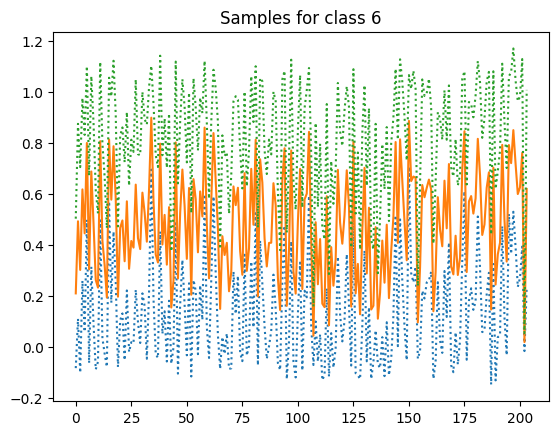

  1%|▋                                                                         | 1000/100000 [05:17<8:06:31,  3.39it/s]

Iter-1000; D_loss: -0.34902653098106384; G_loss: -0.36412152647972107; C_loss: 0.49472489953041077


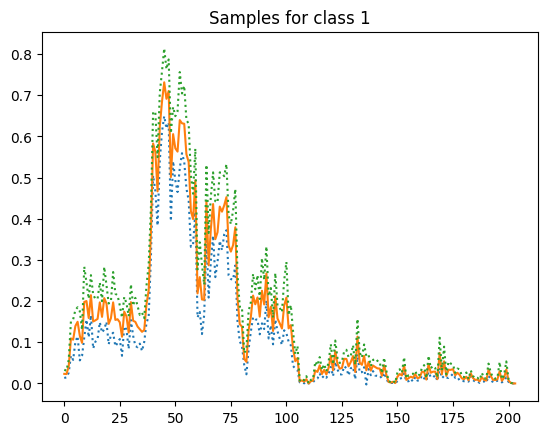

  2%|█▍                                                                        | 2000/100000 [10:28<8:37:02,  3.16it/s]

Iter-2000; D_loss: -0.01092684268951416; G_loss: 0.5294468402862549; C_loss: 0.14654795825481415


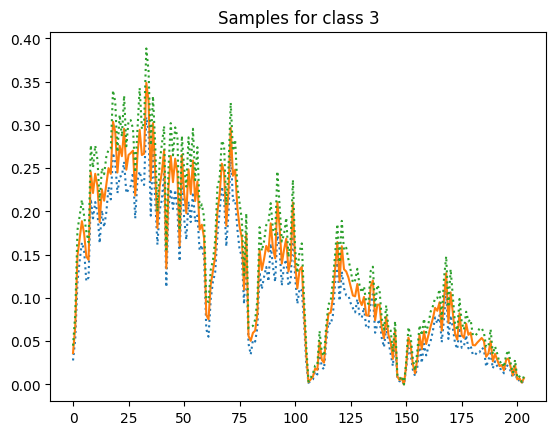

  3%|██▏                                                                       | 3000/100000 [15:42<9:34:43,  2.81it/s]

Iter-3000; D_loss: -0.037886593490839005; G_loss: -0.2460457682609558; C_loss: 0.08977930247783661


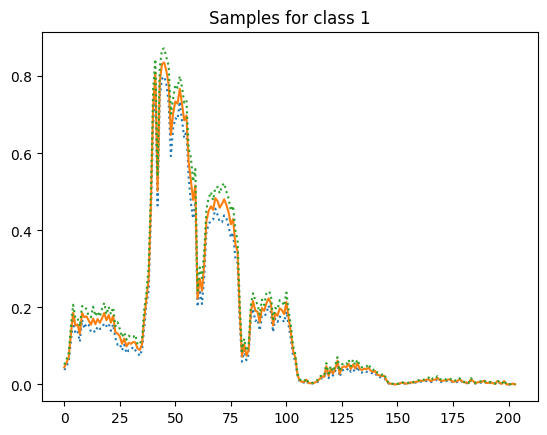

  4%|██▉                                                                       | 4000/100000 [20:56<7:55:05,  3.37it/s]

Iter-4000; D_loss: -0.05895098298788071; G_loss: -0.14365245401859283; C_loss: 0.08216171711683273


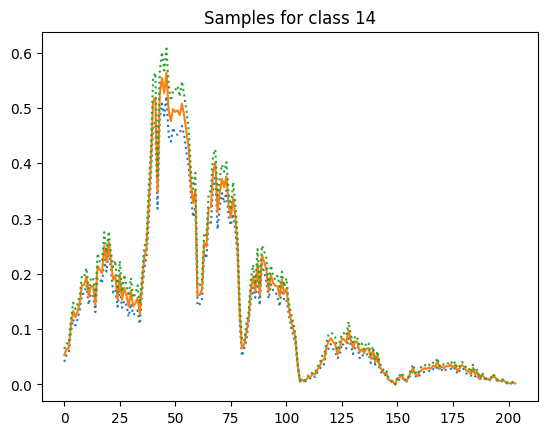

  5%|███▋                                                                      | 5000/100000 [26:10<8:04:26,  3.27it/s]

Iter-5000; D_loss: 0.09234438836574554; G_loss: 0.11658550053834915; C_loss: 0.08187419921159744


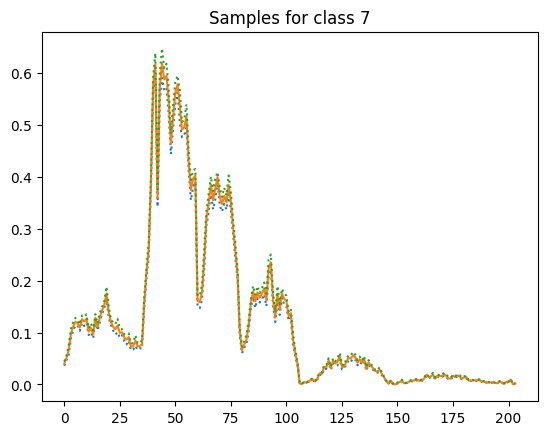

  6%|████▍                                                                     | 6000/100000 [31:26<8:02:58,  3.24it/s]

Iter-6000; D_loss: -0.0644102469086647; G_loss: 2.1760950088500977; C_loss: 0.06237197667360306


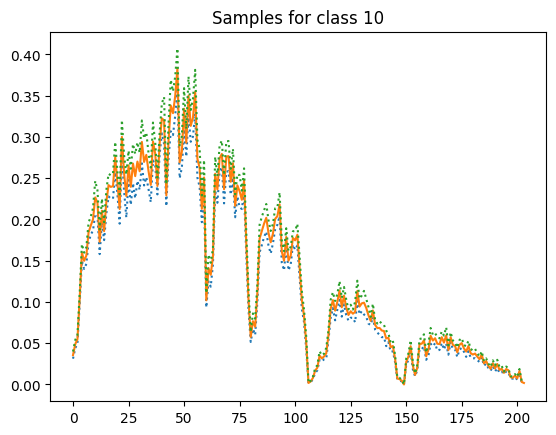

  7%|█████▏                                                                    | 7000/100000 [36:44<8:25:41,  3.07it/s]

Iter-7000; D_loss: -0.08375292271375656; G_loss: 3.1056368350982666; C_loss: 0.0715818852186203


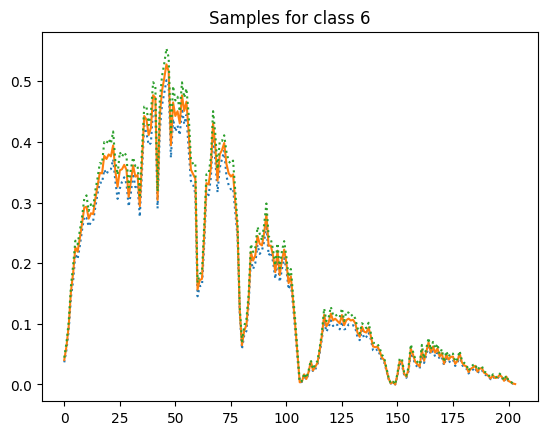

  8%|█████▉                                                                    | 8000/100000 [41:57<8:15:42,  3.09it/s]

Iter-8000; D_loss: -0.0579223707318306; G_loss: 3.6401185989379883; C_loss: 0.06524345278739929


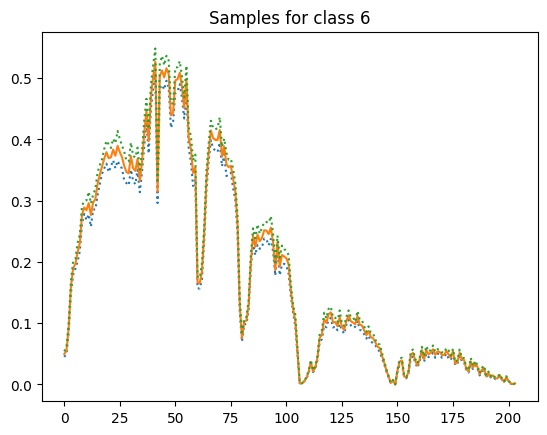

  9%|██████▋                                                                   | 9000/100000 [47:13<7:36:44,  3.32it/s]

Iter-9000; D_loss: 0.010935517027974129; G_loss: 2.1669411659240723; C_loss: 0.0581885501742363


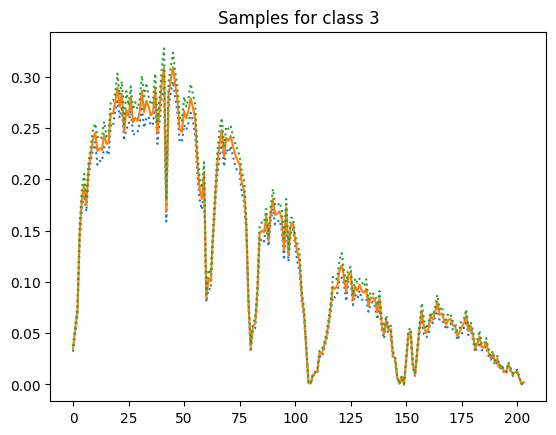

 10%|███████▎                                                                 | 10000/100000 [52:26<8:03:48,  3.10it/s]

Iter-10000; D_loss: -0.05341731756925583; G_loss: 0.18645337224006653; C_loss: 0.05261502042412758


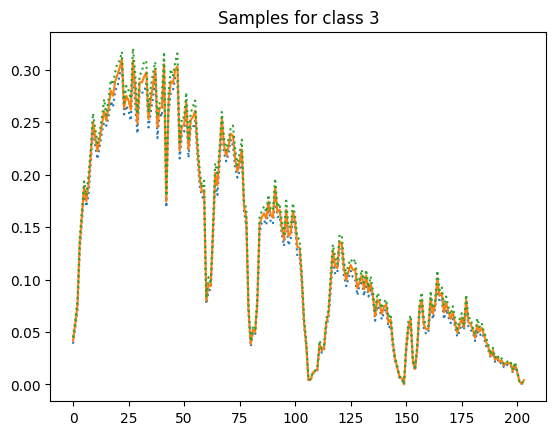

 11%|████████                                                                 | 11000/100000 [57:42<8:09:59,  3.03it/s]

Iter-11000; D_loss: -0.011484459042549133; G_loss: -0.18449640274047852; C_loss: 0.041516952216625214


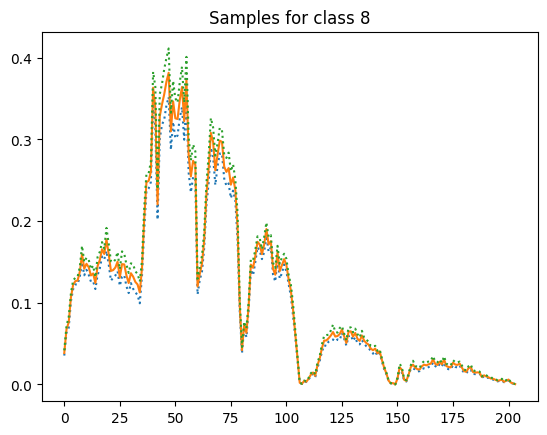

 12%|████████▌                                                              | 12000/100000 [1:02:59<7:47:06,  3.14it/s]

Iter-12000; D_loss: -0.04422033950686455; G_loss: 0.3479982018470764; C_loss: 0.06069163978099823


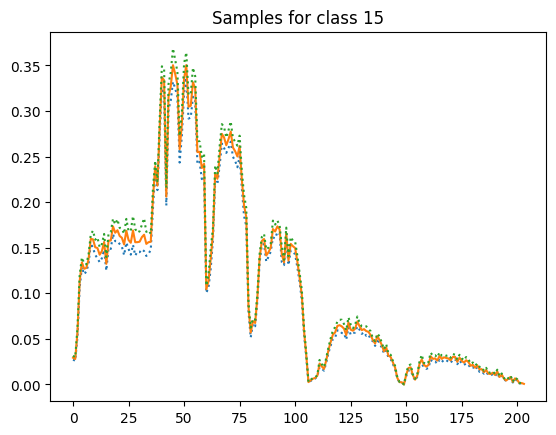

 13%|█████████▏                                                             | 13000/100000 [1:08:15<7:14:32,  3.34it/s]

Iter-13000; D_loss: -0.06539401412010193; G_loss: 0.3783082962036133; C_loss: 0.04336872696876526


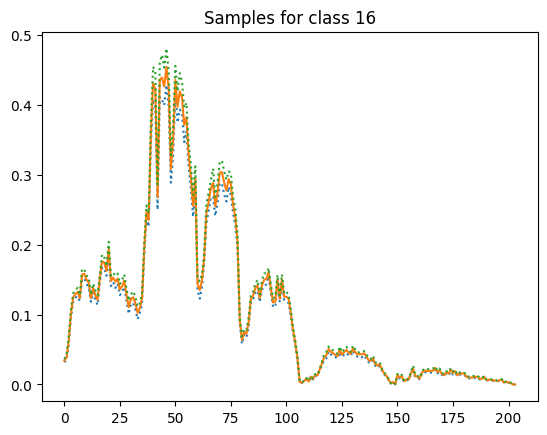

 14%|█████████▉                                                             | 14000/100000 [1:13:29<7:48:34,  3.06it/s]

Iter-14000; D_loss: 0.6295240521430969; G_loss: 1.8178576231002808; C_loss: 0.06995229423046112


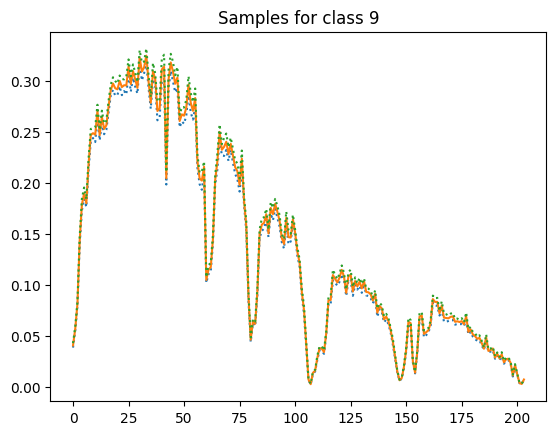

 15%|██████████▋                                                            | 15000/100000 [1:18:44<7:06:57,  3.32it/s]

Iter-15000; D_loss: -0.056170251220464706; G_loss: 1.8877264261245728; C_loss: 0.04480019956827164


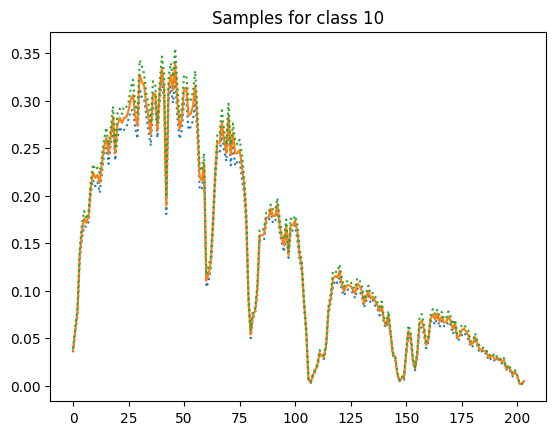

 16%|███████████▎                                                           | 16000/100000 [1:24:00<6:48:34,  3.43it/s]

Iter-16000; D_loss: -0.007245182991027832; G_loss: 1.6464332342147827; C_loss: 0.047874704003334045


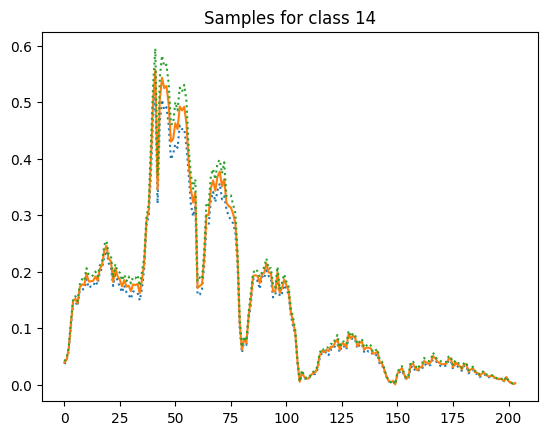

 17%|████████████                                                           | 17000/100000 [1:29:15<7:04:01,  3.26it/s]

Iter-17000; D_loss: -0.040392424911260605; G_loss: 1.8144696950912476; C_loss: 0.04000948369503021


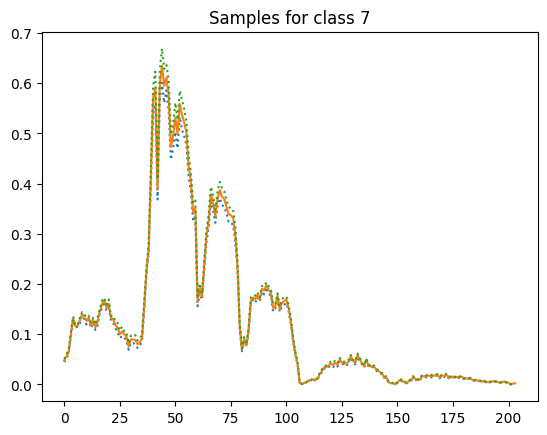

 18%|████████████▊                                                          | 18000/100000 [1:34:30<7:49:04,  2.91it/s]

Iter-18000; D_loss: -0.06266385316848755; G_loss: 1.095264196395874; C_loss: 0.03350316733121872


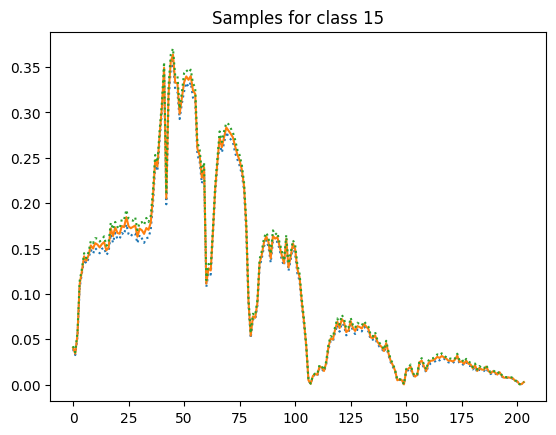

 19%|█████████████▍                                                         | 19000/100000 [1:39:48<7:34:23,  2.97it/s]

Iter-19000; D_loss: -0.03405560925602913; G_loss: 1.327361822128296; C_loss: 0.06163305044174194


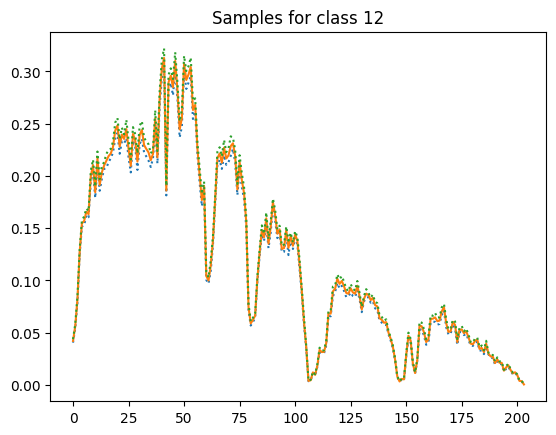

 20%|██████████████▏                                                        | 20000/100000 [1:45:06<6:47:49,  3.27it/s]

Iter-20000; D_loss: 0.02113886922597885; G_loss: 2.9773521423339844; C_loss: 0.02603459730744362


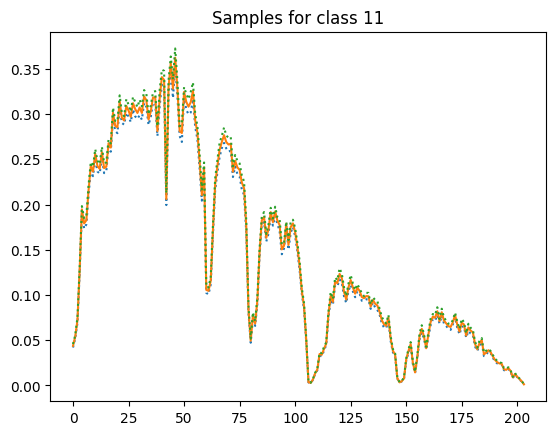

 21%|██████████████▉                                                        | 21000/100000 [1:50:24<7:02:37,  3.12it/s]

Iter-21000; D_loss: -0.0709519013762474; G_loss: 1.9722832441329956; C_loss: 0.0638248547911644


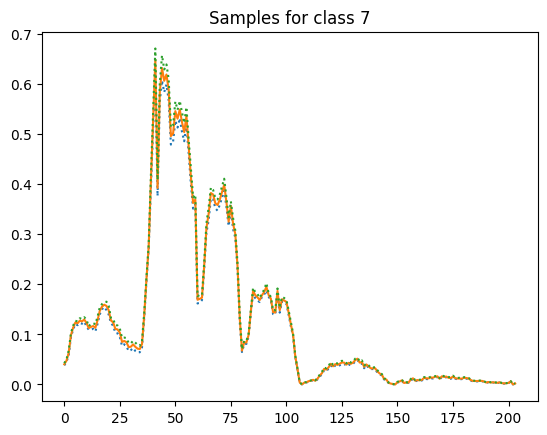

 22%|███████████████▌                                                       | 22000/100000 [1:55:42<6:55:46,  3.13it/s]

Iter-22000; D_loss: -0.062401220202445984; G_loss: 3.0742740631103516; C_loss: 0.04599224403500557


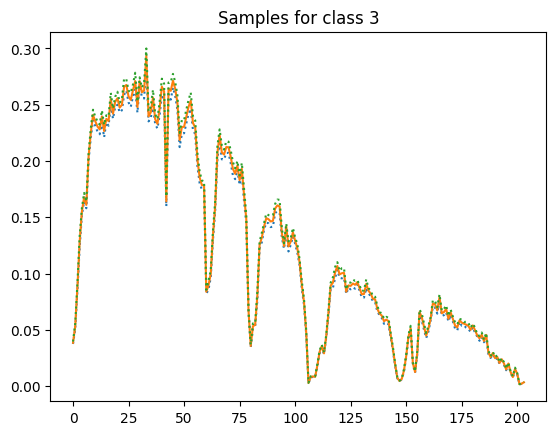

 23%|████████████████▎                                                      | 23000/100000 [2:01:00<6:18:37,  3.39it/s]

Iter-23000; D_loss: -0.06031730771064758; G_loss: 4.157937049865723; C_loss: 0.0277031809091568


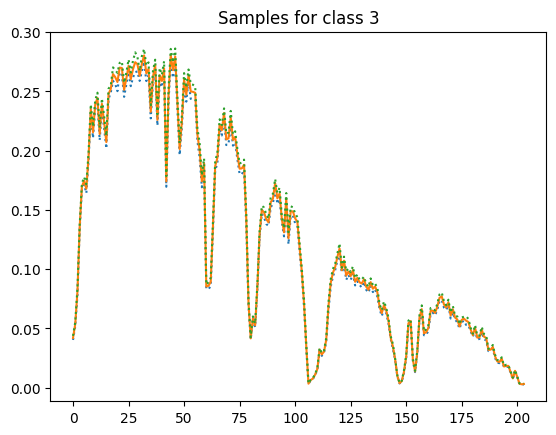

 24%|█████████████████                                                      | 24000/100000 [2:05:23<3:56:58,  5.35it/s]

Iter-24000; D_loss: -0.0068506598472595215; G_loss: 4.887873649597168; C_loss: 0.04618668556213379


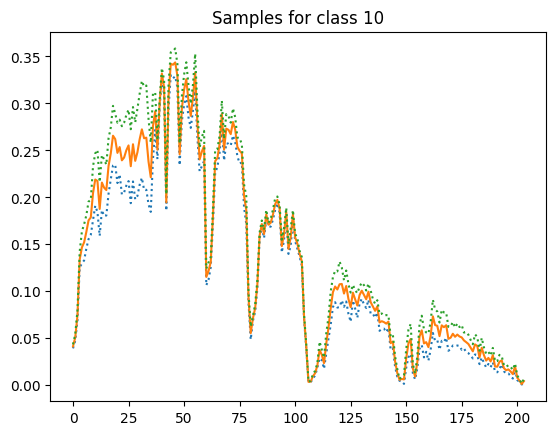

 25%|█████████████████▊                                                     | 25000/100000 [2:08:29<3:54:41,  5.33it/s]

Iter-25000; D_loss: -0.020614001899957657; G_loss: 5.071415901184082; C_loss: 0.04132375493645668


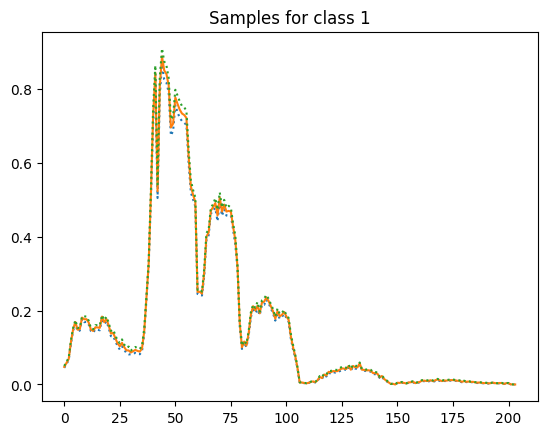

 26%|██████████████████▍                                                    | 26000/100000 [2:11:31<3:38:42,  5.64it/s]

Iter-26000; D_loss: -0.0035772621631622314; G_loss: 5.83872127532959; C_loss: 0.0322793647646904


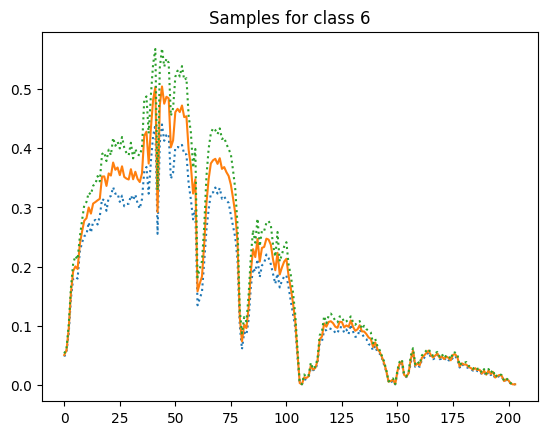

 27%|███████████████████▏                                                   | 27000/100000 [2:14:32<3:43:01,  5.46it/s]

Iter-27000; D_loss: -0.037225283682346344; G_loss: 5.838181495666504; C_loss: 0.026612142100930214


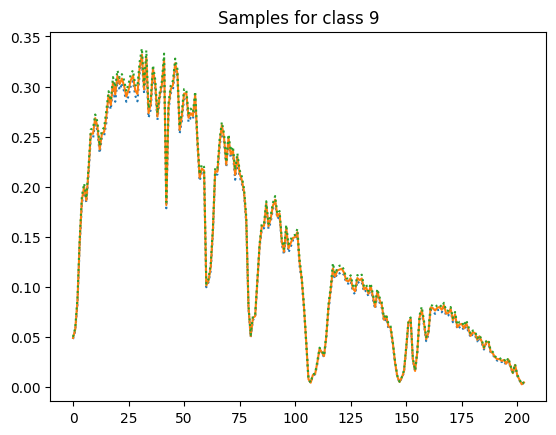

 28%|███████████████████▉                                                   | 28000/100000 [2:17:31<3:20:21,  5.99it/s]

Iter-28000; D_loss: -0.011944305151700974; G_loss: 6.198906898498535; C_loss: 0.01733492873609066


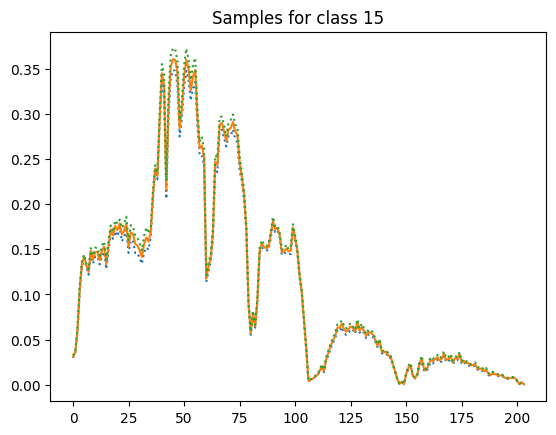

 29%|████████████████████▌                                                  | 29000/100000 [2:20:30<3:36:55,  5.46it/s]

Iter-29000; D_loss: 0.0009214691817760468; G_loss: 6.08143424987793; C_loss: 0.04306197538971901


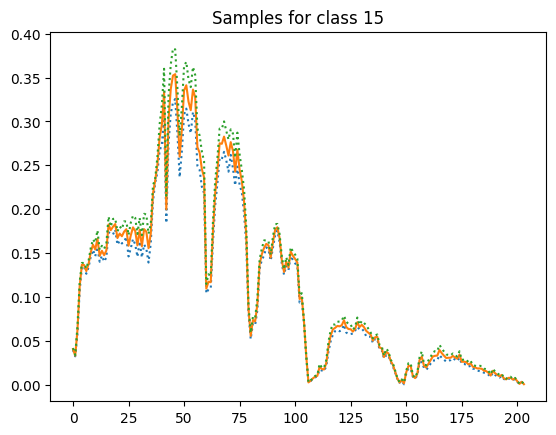

 30%|█████████████████████▎                                                 | 30000/100000 [2:23:31<3:18:10,  5.89it/s]

Iter-30000; D_loss: 0.018853284418582916; G_loss: 5.956564426422119; C_loss: 0.02872605063021183


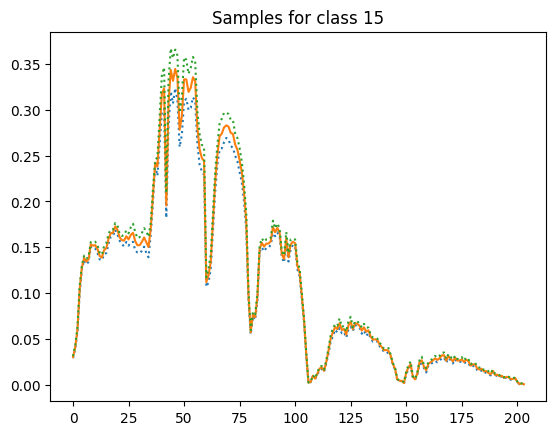

 31%|██████████████████████                                                 | 31000/100000 [2:26:33<3:17:07,  5.83it/s]

Iter-31000; D_loss: -0.0627199038863182; G_loss: 5.242496013641357; C_loss: 0.035834793001413345


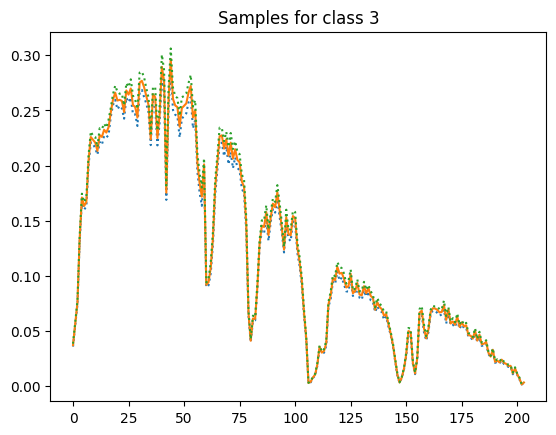

 32%|██████████████████████▋                                                | 32000/100000 [2:29:32<3:20:53,  5.64it/s]

Iter-32000; D_loss: -0.015323173254728317; G_loss: 5.354937553405762; C_loss: 0.030997920781373978


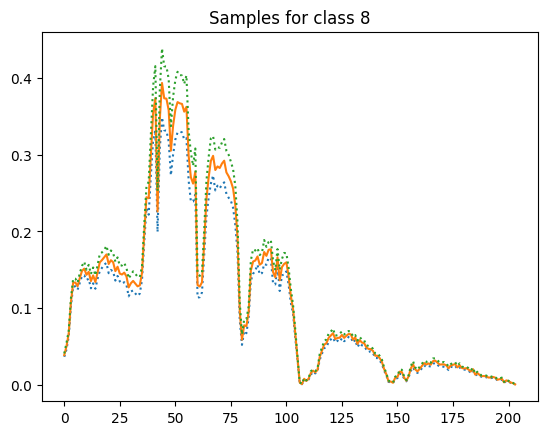

 33%|███████████████████████▍                                               | 33000/100000 [2:32:33<2:58:19,  6.26it/s]

Iter-33000; D_loss: -0.02770853042602539; G_loss: 5.119260787963867; C_loss: 0.030725417658686638


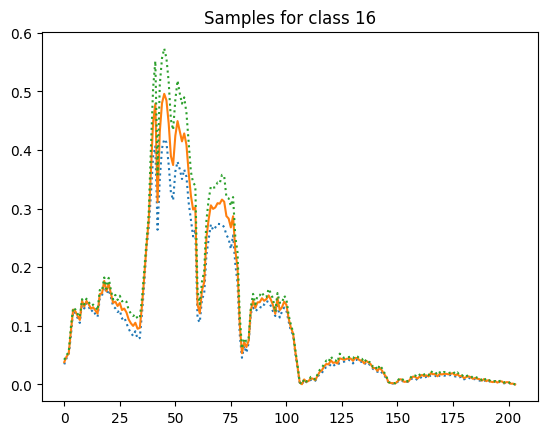

 34%|████████████████████████▏                                              | 34000/100000 [2:35:33<3:40:03,  5.00it/s]

Iter-34000; D_loss: -0.04824008792638779; G_loss: 4.770928859710693; C_loss: 0.04247237369418144


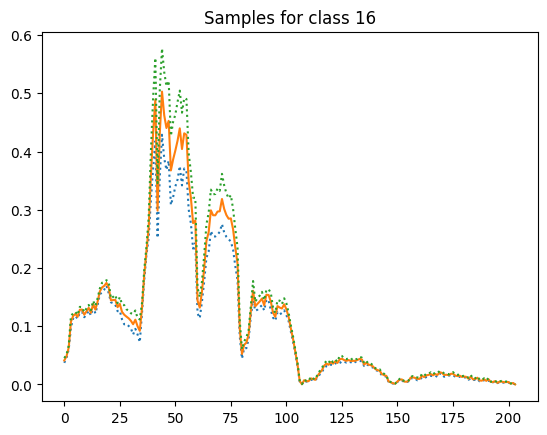

 35%|████████████████████████▊                                              | 35000/100000 [2:38:35<3:04:43,  5.86it/s]

Iter-35000; D_loss: -0.04095383733510971; G_loss: 4.056429862976074; C_loss: 0.02749258652329445


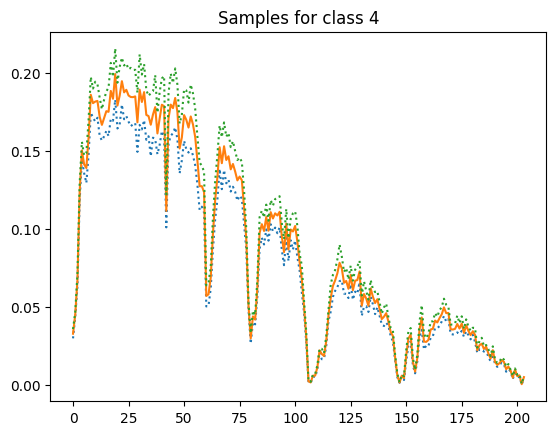

 36%|█████████████████████████▌                                             | 36000/100000 [2:41:38<6:04:32,  2.93it/s]

Iter-36000; D_loss: -0.014690244570374489; G_loss: 4.106165885925293; C_loss: 0.027149783447384834


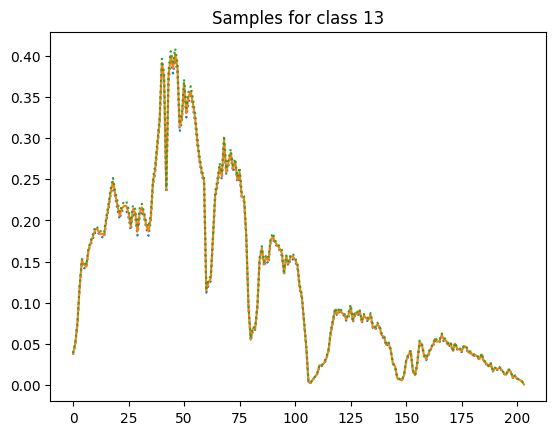

 37%|██████████████████████████▎                                            | 37000/100000 [2:45:44<3:11:48,  5.47it/s]

Iter-37000; D_loss: 0.030343152582645416; G_loss: 3.2714996337890625; C_loss: 0.031252000480890274


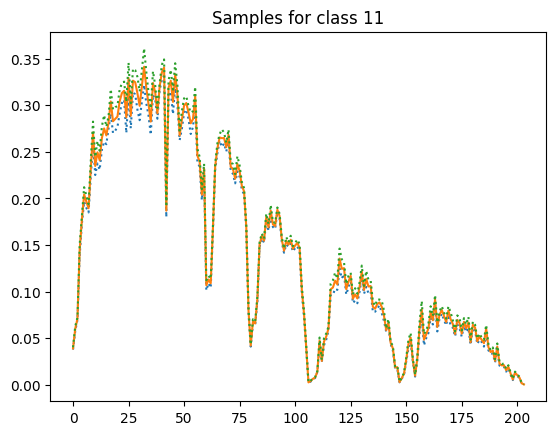

 38%|██████████████████████████▉                                            | 38000/100000 [2:48:47<2:57:33,  5.82it/s]

Iter-38000; D_loss: -0.05067608878016472; G_loss: 3.3822805881500244; C_loss: 0.025151802226901054


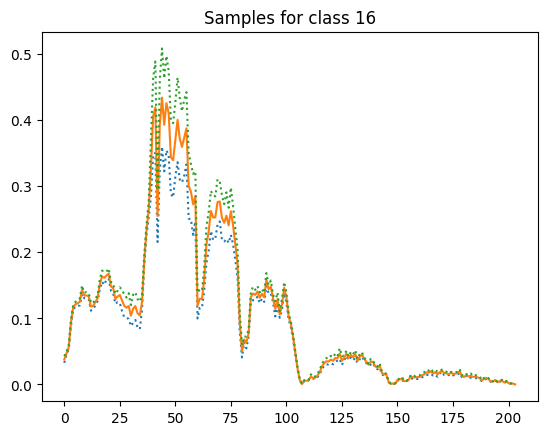

 39%|███████████████████████████▋                                           | 39000/100000 [2:51:46<3:01:14,  5.61it/s]

Iter-39000; D_loss: -0.05579593777656555; G_loss: 4.574286460876465; C_loss: 0.017315911129117012


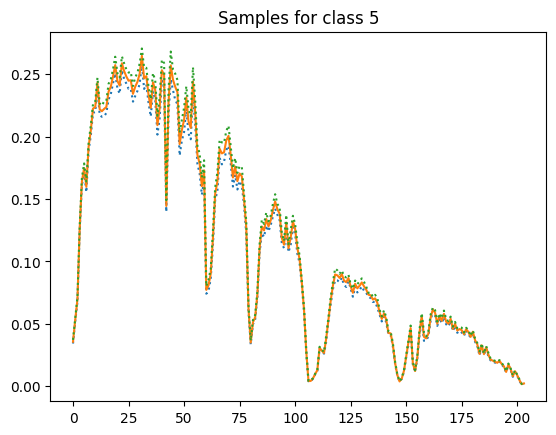

 40%|████████████████████████████▍                                          | 40000/100000 [2:54:51<2:59:17,  5.58it/s]

Iter-40000; D_loss: -0.019736606627702713; G_loss: 5.312749862670898; C_loss: 0.019943779334425926


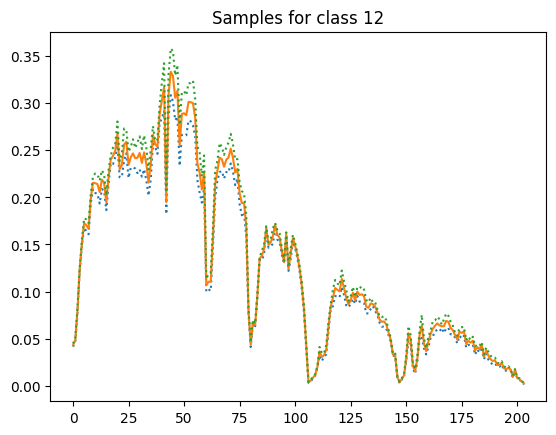

 41%|█████████████████████████████                                          | 41000/100000 [2:57:58<3:05:48,  5.29it/s]

Iter-41000; D_loss: -0.04004887491464615; G_loss: 6.293850898742676; C_loss: 0.020783526822924614


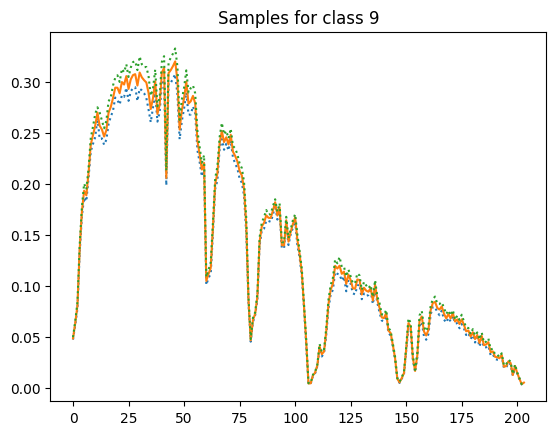

 42%|█████████████████████████████▊                                         | 42000/100000 [3:01:45<3:16:36,  4.92it/s]

Iter-42000; D_loss: 0.0212695449590683; G_loss: 7.185608386993408; C_loss: 0.015530560165643692


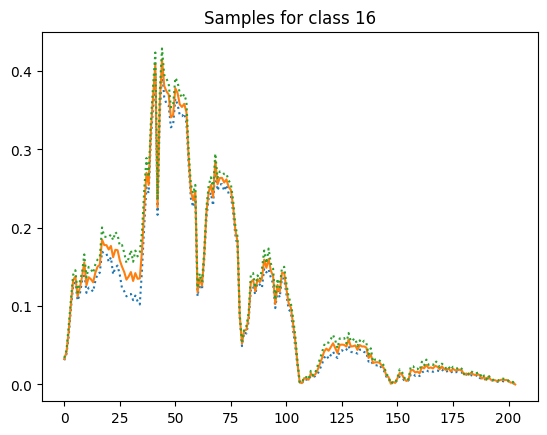

 43%|██████████████████████████████▌                                        | 43000/100000 [3:05:09<3:13:41,  4.90it/s]

Iter-43000; D_loss: -0.057932689785957336; G_loss: 7.391322135925293; C_loss: 0.04629270359873772


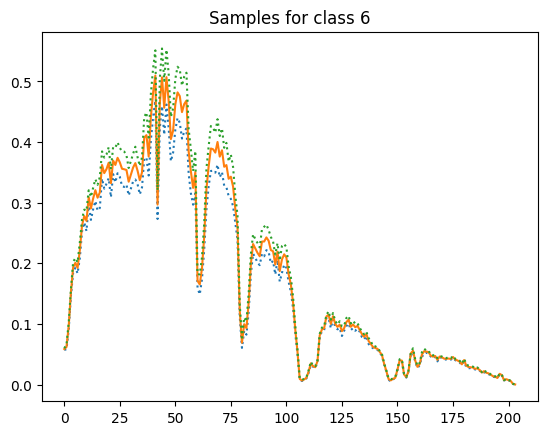

 44%|███████████████████████████████▏                                       | 44000/100000 [3:08:19<2:58:53,  5.22it/s]

Iter-44000; D_loss: -0.05830121040344238; G_loss: 8.632584571838379; C_loss: 0.021667080000042915


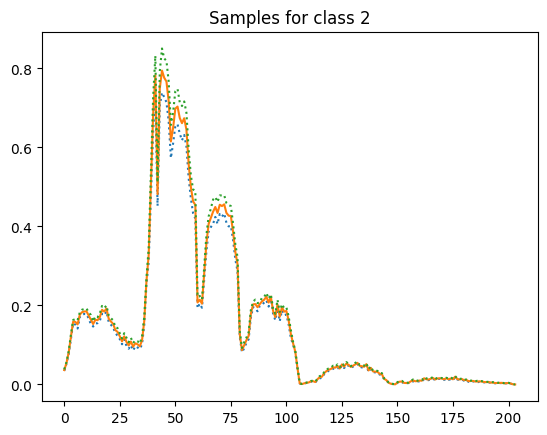

 45%|███████████████████████████████▉                                       | 45000/100000 [3:11:32<2:51:31,  5.34it/s]

Iter-45000; D_loss: 0.010094456374645233; G_loss: 9.327760696411133; C_loss: 0.04538595676422119


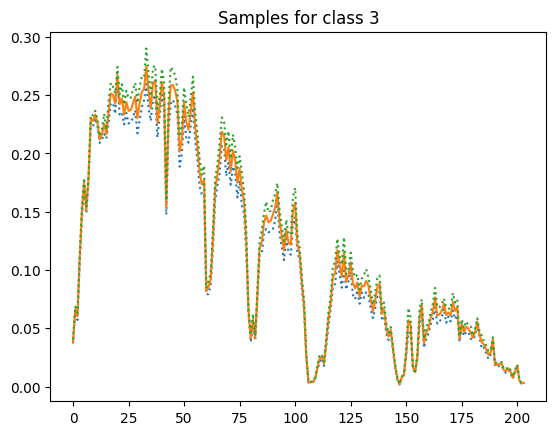

 46%|████████████████████████████████▋                                      | 46000/100000 [3:14:44<2:45:55,  5.42it/s]

Iter-46000; D_loss: -0.06460221111774445; G_loss: 9.449763298034668; C_loss: 0.04909548535943031


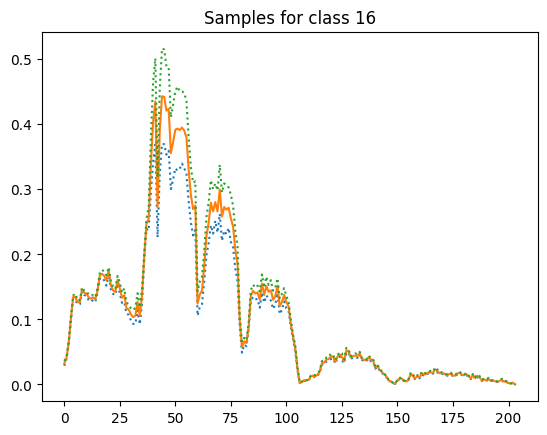

 47%|█████████████████████████████████▎                                     | 47000/100000 [3:17:50<2:31:29,  5.83it/s]

Iter-47000; D_loss: -0.025484217330813408; G_loss: 10.614761352539062; C_loss: 0.014863991178572178


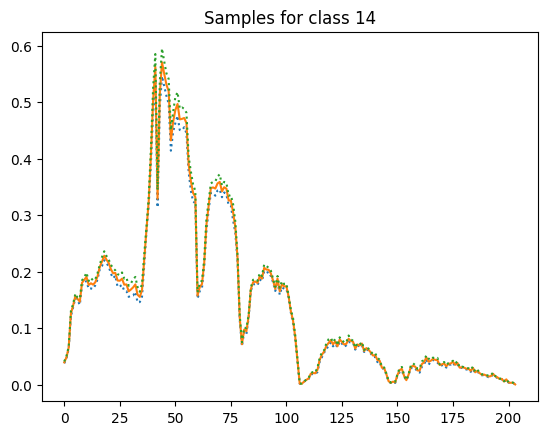

 48%|██████████████████████████████████                                     | 48000/100000 [3:20:56<2:39:12,  5.44it/s]

Iter-48000; D_loss: -0.055722739547491074; G_loss: 11.631103515625; C_loss: 0.01869167387485504


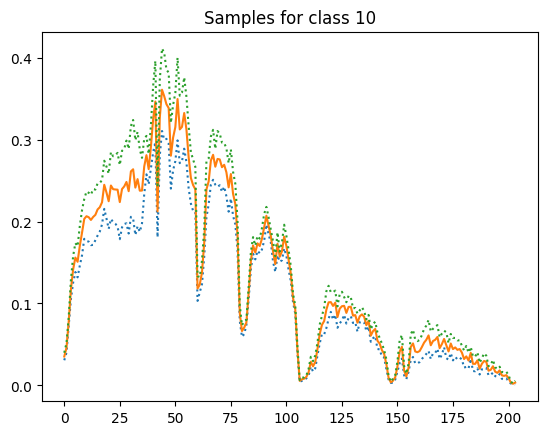

 49%|██████████████████████████████████▊                                    | 49000/100000 [3:24:05<2:43:18,  5.20it/s]

Iter-49000; D_loss: -0.05278383940458298; G_loss: 12.560796737670898; C_loss: 0.01998646929860115


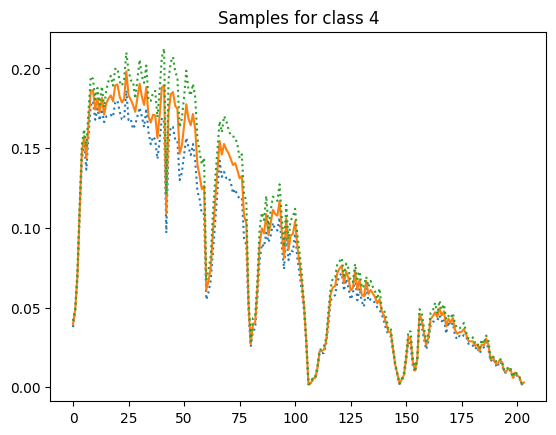

 50%|███████████████████████████████████▌                                   | 50000/100000 [3:27:19<2:25:01,  5.75it/s]

Iter-50000; D_loss: -0.03803514316678047; G_loss: 13.196259498596191; C_loss: 0.017415957525372505


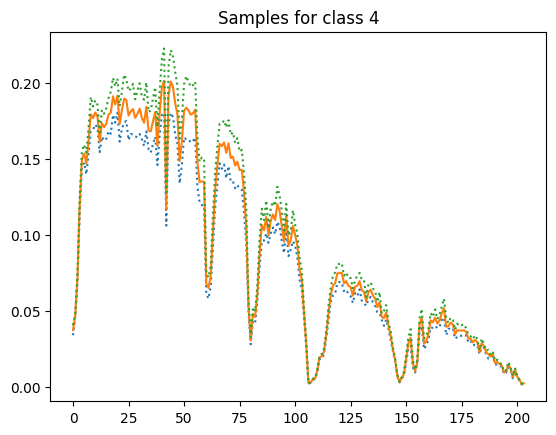

 51%|████████████████████████████████████▏                                  | 51000/100000 [3:30:26<2:28:20,  5.51it/s]

Iter-51000; D_loss: -0.04701216518878937; G_loss: 13.994037628173828; C_loss: 0.021304652094841003


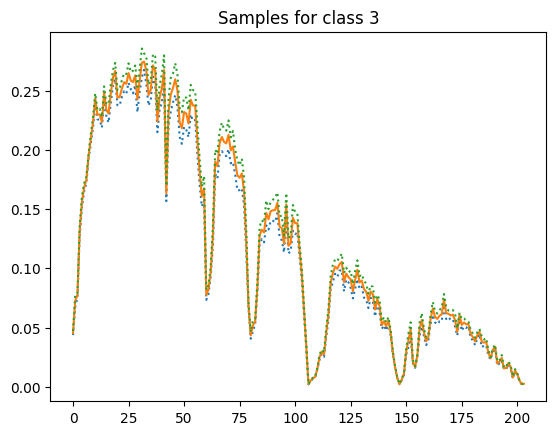

 52%|████████████████████████████████████▉                                  | 52000/100000 [3:33:56<2:26:33,  5.46it/s]

Iter-52000; D_loss: -0.01186816394329071; G_loss: 14.101685523986816; C_loss: 0.01813705451786518


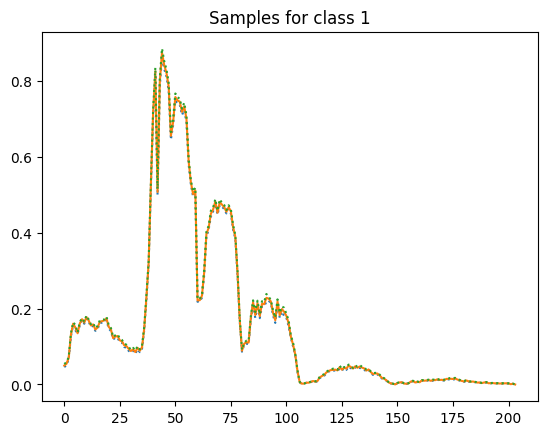

 53%|█████████████████████████████████████▋                                 | 53000/100000 [3:37:03<2:23:05,  5.47it/s]

Iter-53000; D_loss: -0.018979176878929138; G_loss: 14.674418449401855; C_loss: 0.02830447629094124


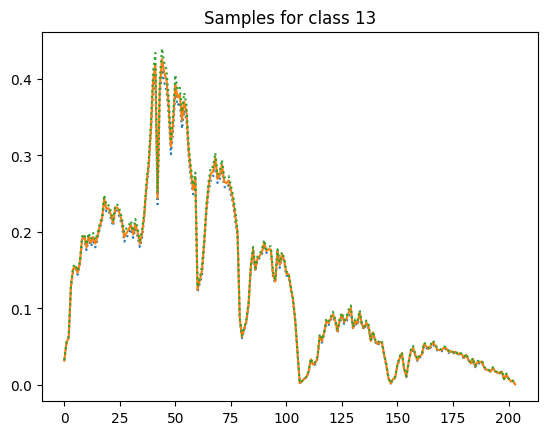

 54%|██████████████████████████████████████▎                                | 54000/100000 [3:40:12<2:26:56,  5.22it/s]

Iter-54000; D_loss: -0.03961778059601784; G_loss: 15.547089576721191; C_loss: 0.015500452369451523


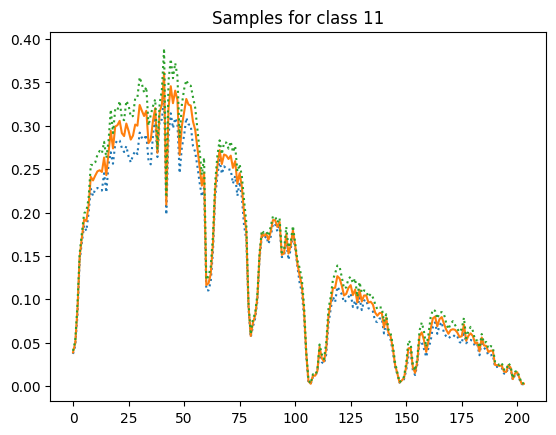

 55%|███████████████████████████████████████                                | 55000/100000 [3:43:22<2:20:56,  5.32it/s]

Iter-55000; D_loss: -0.04913768172264099; G_loss: 16.125598907470703; C_loss: 0.032970692962408066


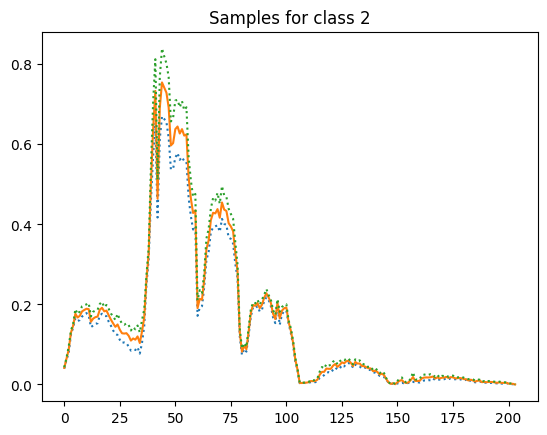

 56%|███████████████████████████████████████▊                               | 56000/100000 [3:46:29<2:11:57,  5.56it/s]

Iter-56000; D_loss: -0.03226508945226669; G_loss: 16.879878997802734; C_loss: 0.01652979850769043


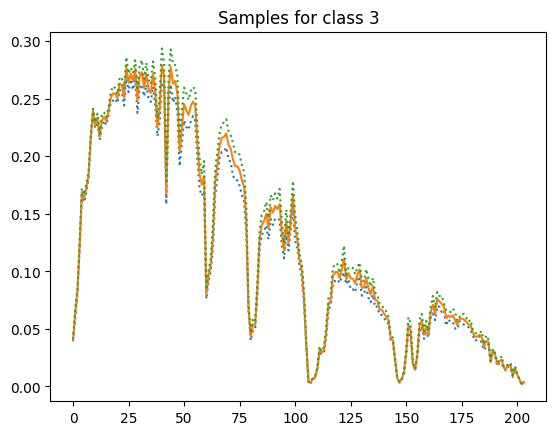

 57%|████████████████████████████████████████▍                              | 57000/100000 [3:49:36<2:05:07,  5.73it/s]

Iter-57000; D_loss: -0.0521128848195076; G_loss: 17.617095947265625; C_loss: 0.014353821985423565


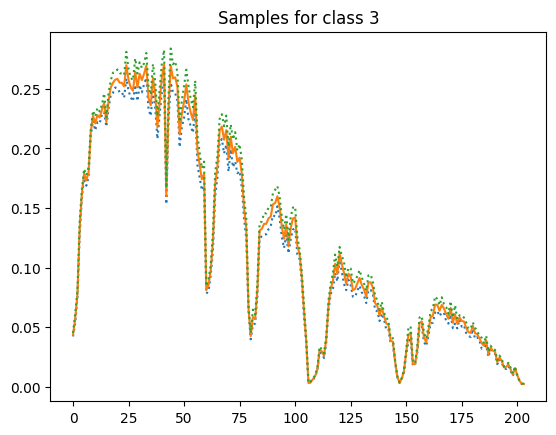

 58%|█████████████████████████████████████████▏                             | 58000/100000 [3:52:44<2:15:39,  5.16it/s]

Iter-58000; D_loss: -0.04839351400732994; G_loss: 18.331974029541016; C_loss: 0.009900752454996109


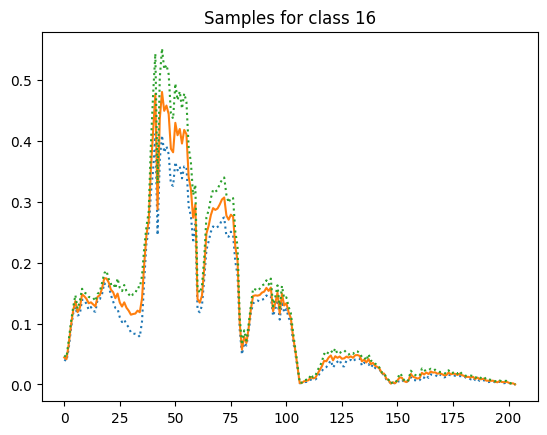

 59%|█████████████████████████████████████████▉                             | 59000/100000 [3:55:53<2:08:55,  5.30it/s]

Iter-59000; D_loss: -0.030408183112740517; G_loss: 18.932331085205078; C_loss: 0.013218912295997143


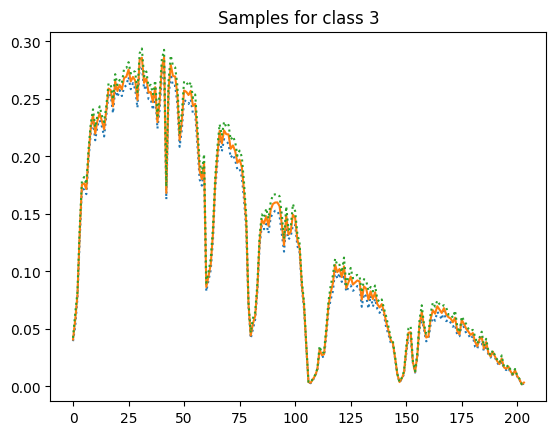

 60%|██████████████████████████████████████████▌                            | 60000/100000 [3:59:08<2:13:26,  5.00it/s]

Iter-60000; D_loss: -0.03566921129822731; G_loss: 19.9525089263916; C_loss: 0.013212610967457294


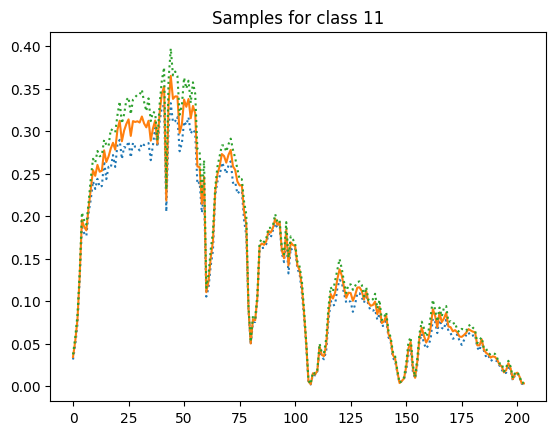

 61%|███████████████████████████████████████████▎                           | 61000/100000 [4:02:16<2:17:48,  4.72it/s]

Iter-61000; D_loss: -0.060897648334503174; G_loss: 21.04234504699707; C_loss: 0.011394865810871124


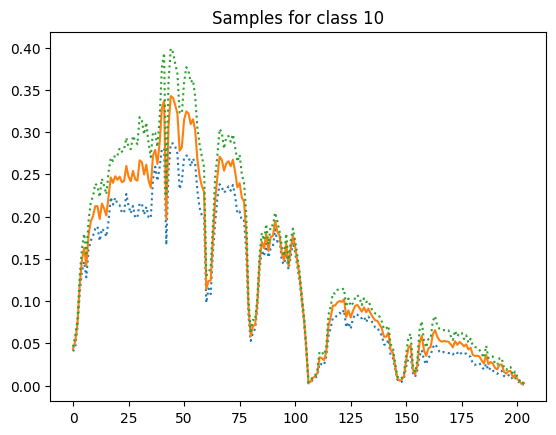

 62%|████████████████████████████████████████████                           | 62000/100000 [4:05:24<1:55:11,  5.50it/s]

Iter-62000; D_loss: -0.027375781908631325; G_loss: 21.683902740478516; C_loss: 0.01628716103732586


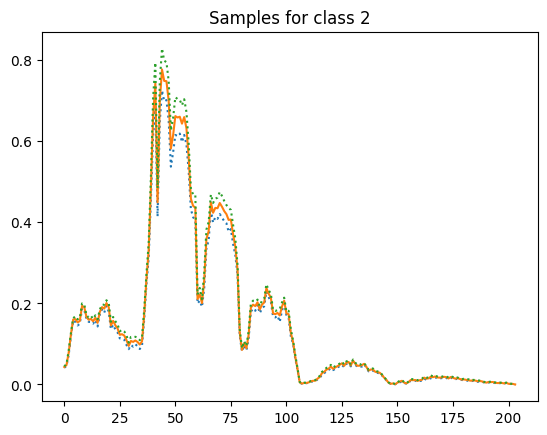

 63%|████████████████████████████████████████████▋                          | 63000/100000 [4:08:49<2:35:07,  3.98it/s]

Iter-63000; D_loss: -0.010118946433067322; G_loss: 22.347965240478516; C_loss: 0.009207557886838913


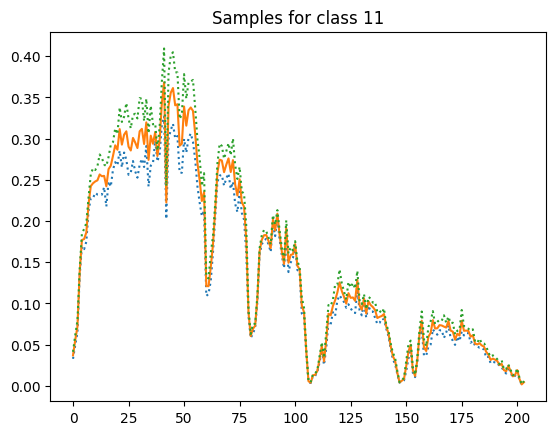

 64%|█████████████████████████████████████████████▍                         | 64000/100000 [4:12:10<1:55:43,  5.18it/s]

Iter-64000; D_loss: -0.044223543256521225; G_loss: 23.083518981933594; C_loss: 0.01237414963543415


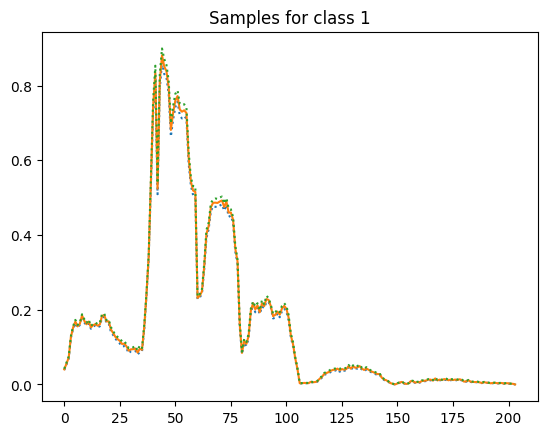

 65%|██████████████████████████████████████████████▏                        | 65000/100000 [4:15:19<1:51:07,  5.25it/s]

Iter-65000; D_loss: -0.05689564347267151; G_loss: 23.455974578857422; C_loss: 0.009934750385582447


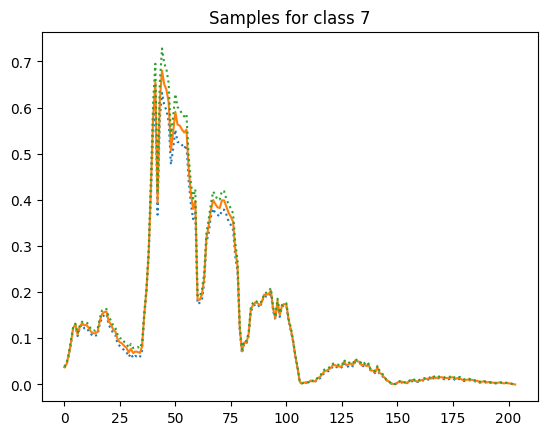

 66%|██████████████████████████████████████████████▊                        | 66000/100000 [4:18:27<1:45:17,  5.38it/s]

Iter-66000; D_loss: -0.007870063185691833; G_loss: 23.928325653076172; C_loss: 0.03978490084409714


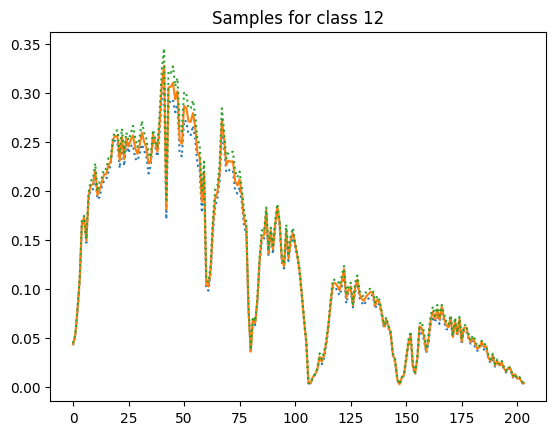

 67%|███████████████████████████████████████████████▌                       | 67000/100000 [4:21:35<1:42:55,  5.34it/s]

Iter-67000; D_loss: -0.014821729622781277; G_loss: 24.564250946044922; C_loss: 0.012925276532769203


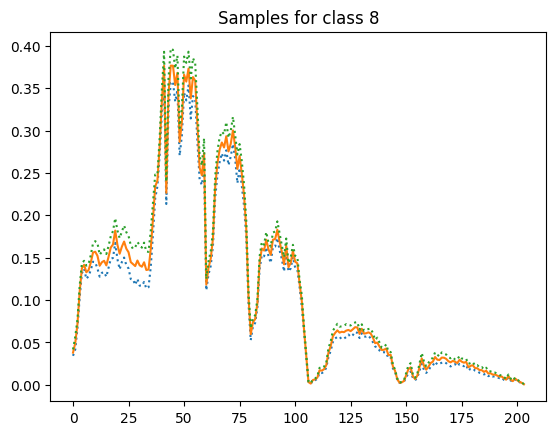

 68%|████████████████████████████████████████████████▎                      | 68000/100000 [4:24:44<1:31:16,  5.84it/s]

Iter-68000; D_loss: -0.044695597141981125; G_loss: 25.222919464111328; C_loss: 0.010960336774587631


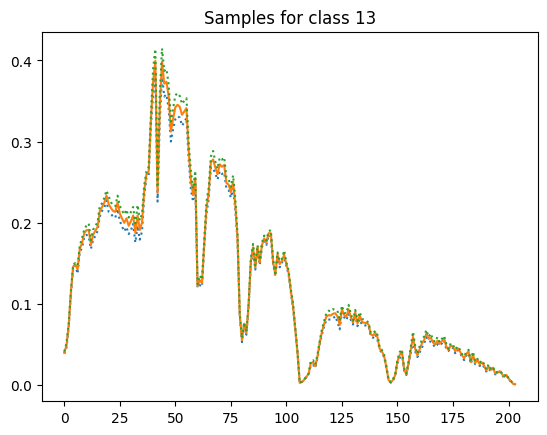

 69%|████████████████████████████████████████████████▉                      | 69000/100000 [4:27:53<1:31:09,  5.67it/s]

Iter-69000; D_loss: -0.04808245226740837; G_loss: 25.264827728271484; C_loss: 0.01467585377395153


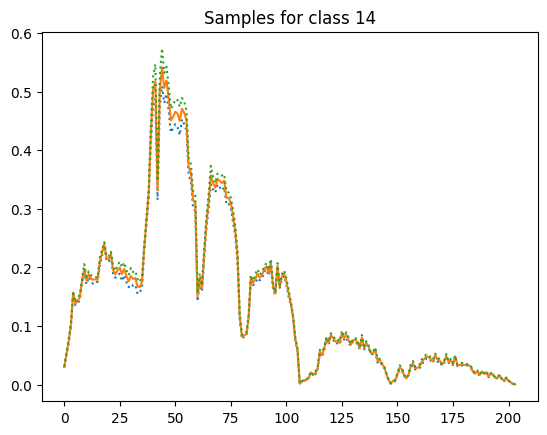

 70%|█████████████████████████████████████████████████▋                     | 70000/100000 [4:31:03<1:30:32,  5.52it/s]

Iter-70000; D_loss: -0.004707414656877518; G_loss: 25.928579330444336; C_loss: 0.013753553852438927


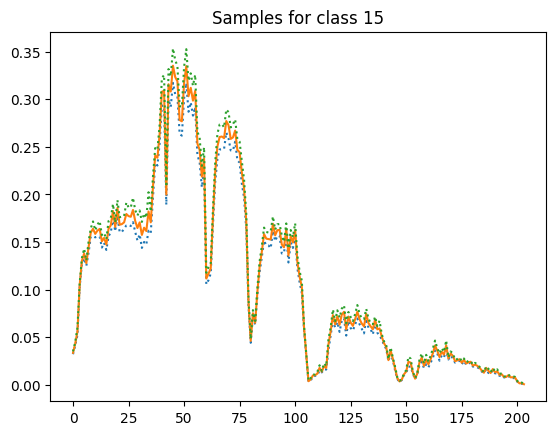

 71%|██████████████████████████████████████████████████▍                    | 71000/100000 [4:34:15<1:27:54,  5.50it/s]

Iter-71000; D_loss: -0.061288394033908844; G_loss: 26.60027313232422; C_loss: 0.011344218626618385


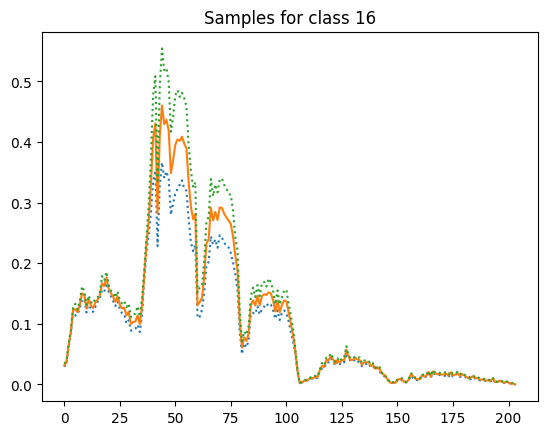

 72%|███████████████████████████████████████████████████                    | 72000/100000 [4:37:22<1:23:15,  5.61it/s]

Iter-72000; D_loss: -0.05792622268199921; G_loss: 26.943714141845703; C_loss: 0.011082700453698635


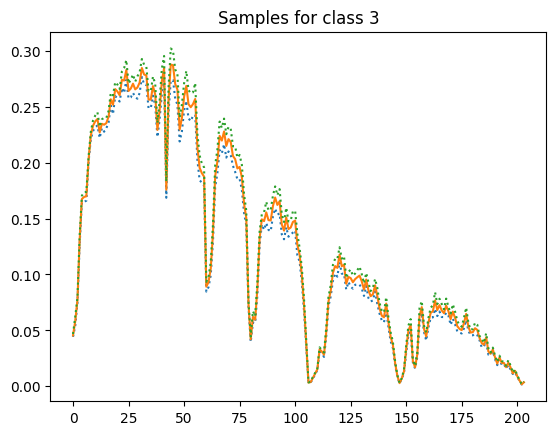

 73%|███████████████████████████████████████████████████▊                   | 73000/100000 [4:40:32<1:22:28,  5.46it/s]

Iter-73000; D_loss: -0.033732760697603226; G_loss: 27.284584045410156; C_loss: 0.005718933418393135


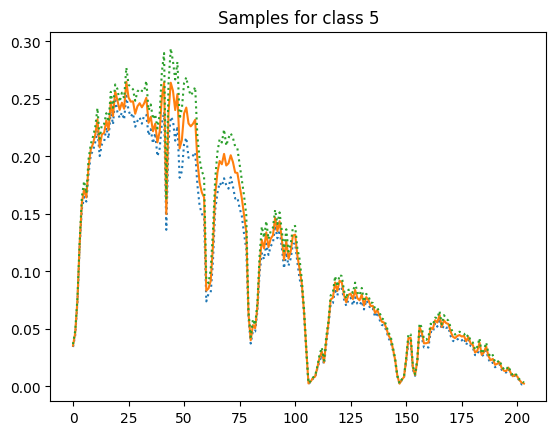

 74%|████████████████████████████████████████████████████▌                  | 74000/100000 [4:43:44<1:20:40,  5.37it/s]

Iter-74000; D_loss: -0.02678382769227028; G_loss: 27.480426788330078; C_loss: 0.01722811907529831


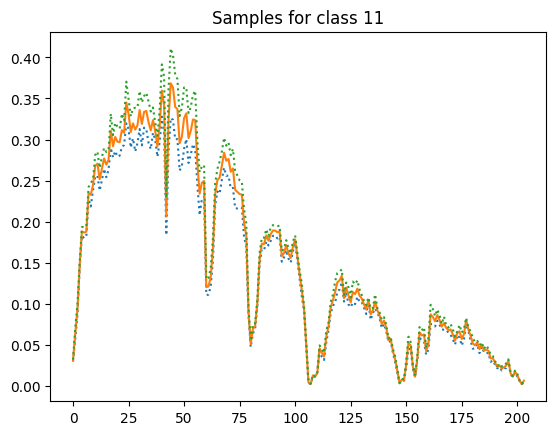

 75%|█████████████████████████████████████████████████████▎                 | 75000/100000 [4:46:54<1:16:04,  5.48it/s]

Iter-75000; D_loss: -0.04535333067178726; G_loss: 27.837085723876953; C_loss: 0.006394653115421534


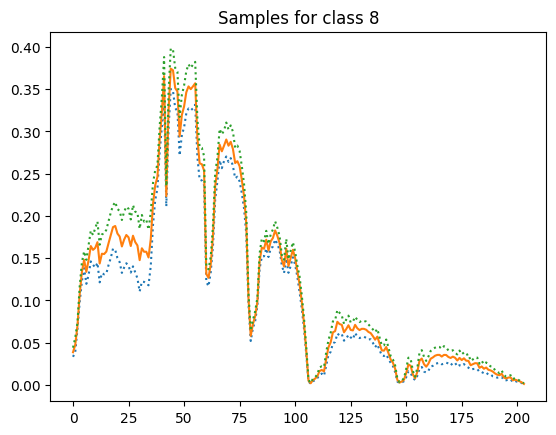

 76%|█████████████████████████████████████████████████████▉                 | 76000/100000 [4:50:08<1:23:44,  4.78it/s]

Iter-76000; D_loss: -0.03573126718401909; G_loss: 28.34549331665039; C_loss: 0.008841414004564285


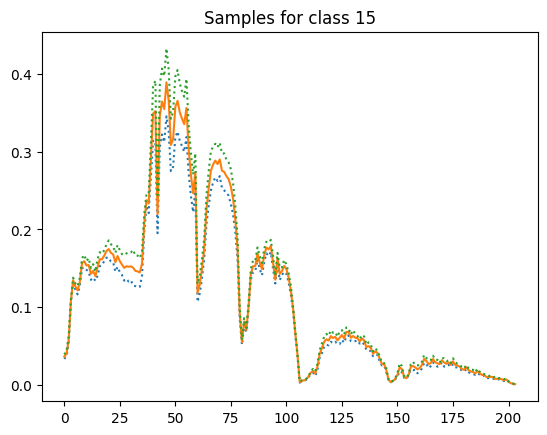

 77%|██████████████████████████████████████████████████████▋                | 77000/100000 [4:53:15<1:12:39,  5.28it/s]

Iter-77000; D_loss: 0.01280832290649414; G_loss: 28.915340423583984; C_loss: 0.011825612746179104


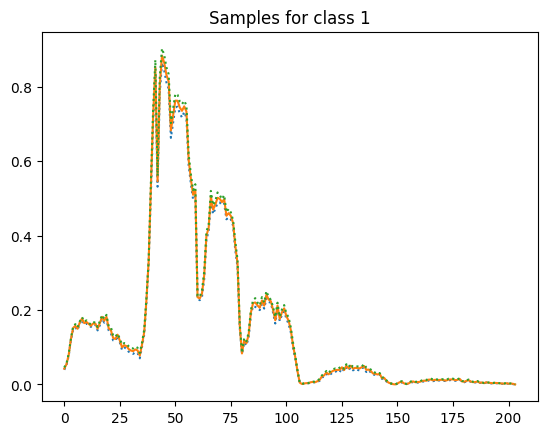

 78%|███████████████████████████████████████████████████████▍               | 78000/100000 [4:56:25<1:08:34,  5.35it/s]

Iter-78000; D_loss: -0.009806537069380283; G_loss: 29.579212188720703; C_loss: 0.1176881492137909


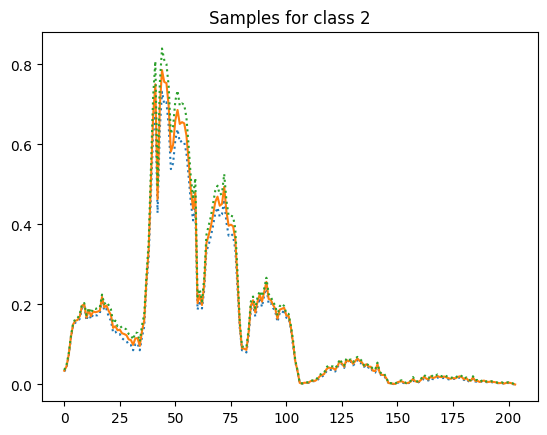

 79%|████████████████████████████████████████████████████████               | 79000/100000 [4:59:36<1:05:21,  5.36it/s]

Iter-79000; D_loss: -0.022049620747566223; G_loss: 29.01848030090332; C_loss: 0.02901678904891014


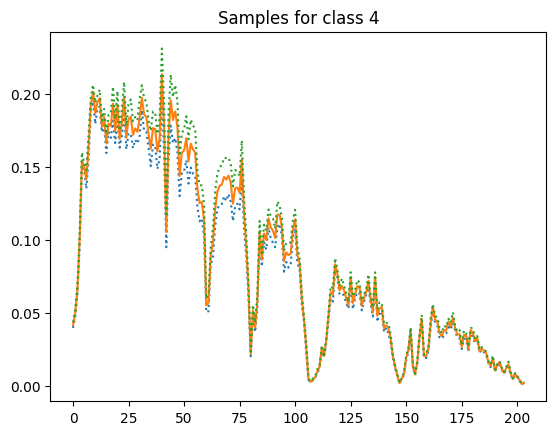

 80%|████████████████████████████████████████████████████████▊              | 80000/100000 [5:02:43<1:03:56,  5.21it/s]

Iter-80000; D_loss: -0.03271491080522537; G_loss: 29.257720947265625; C_loss: 0.010220637544989586


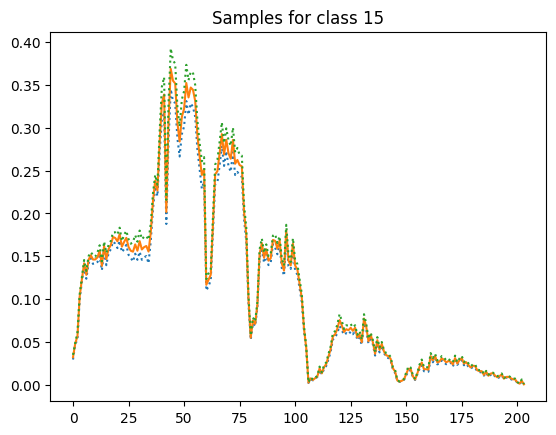

 81%|█████████████████████████████████████████████████████████▌             | 81000/100000 [5:05:53<1:06:17,  4.78it/s]

Iter-81000; D_loss: 0.00544375367462635; G_loss: 29.713485717773438; C_loss: 0.005938425660133362


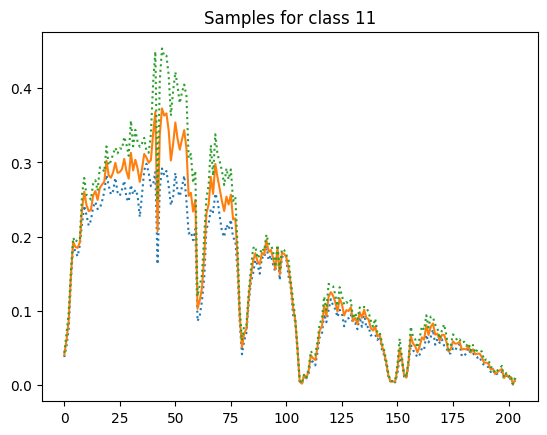

 82%|███████████████████████████████████████████████████████████▊             | 82000/100000 [5:09:04<52:42,  5.69it/s]

Iter-82000; D_loss: -0.01474134624004364; G_loss: 30.129657745361328; C_loss: 0.010297958739101887


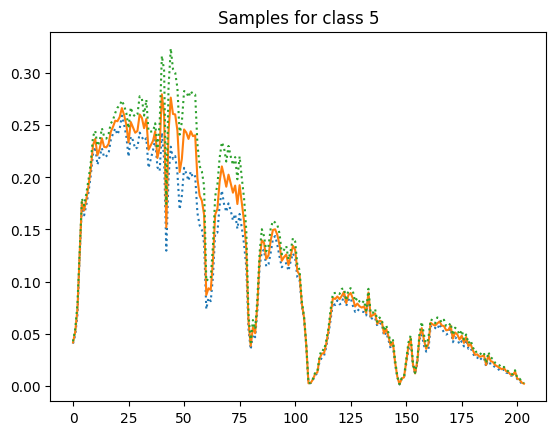

 83%|████████████████████████████████████████████████████████████▌            | 83000/100000 [5:12:12<48:22,  5.86it/s]

Iter-83000; D_loss: -0.03812937065958977; G_loss: 30.324295043945312; C_loss: 0.004918267484754324


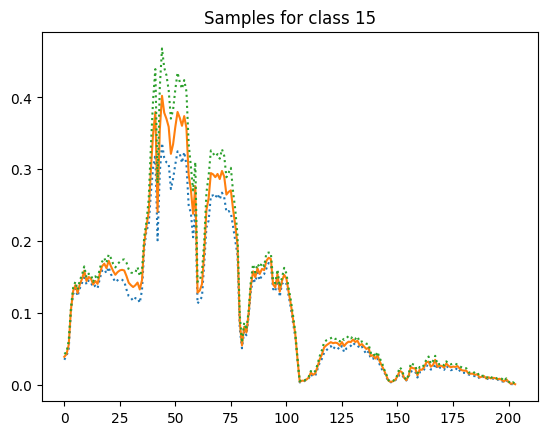

 84%|█████████████████████████████████████████████████████████████▎           | 84000/100000 [5:15:20<46:56,  5.68it/s]

Iter-84000; D_loss: -0.03393450379371643; G_loss: 30.721677780151367; C_loss: 0.2378113716840744


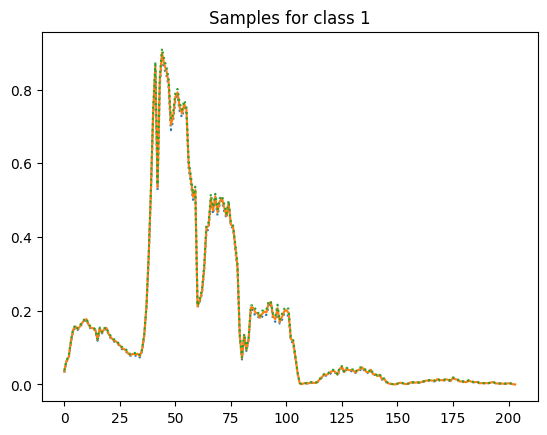

 85%|██████████████████████████████████████████████████████████████           | 85000/100000 [5:18:52<45:30,  5.49it/s]

Iter-85000; D_loss: -0.046567417681217194; G_loss: 30.94527816772461; C_loss: 0.007422749884426594


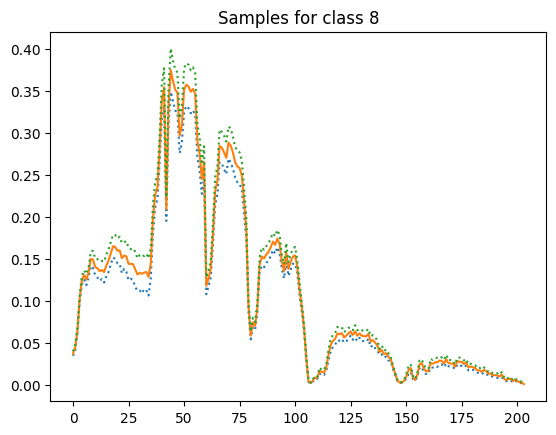

 86%|██████████████████████████████████████████████████████████████▊          | 86000/100000 [5:22:18<49:10,  4.74it/s]

Iter-86000; D_loss: -0.02769700065255165; G_loss: 31.191511154174805; C_loss: 0.004472326021641493


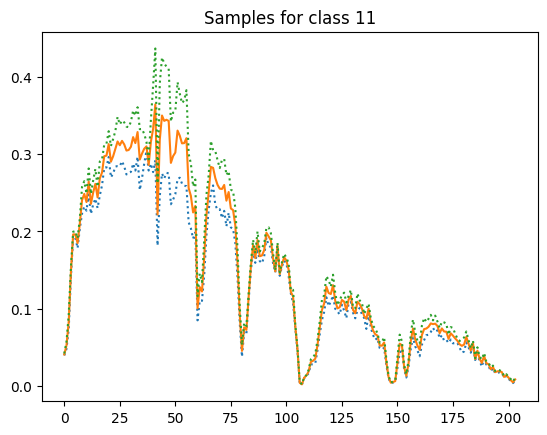

 87%|███████████████████████████████████████████████████████████████▌         | 87000/100000 [5:25:50<44:07,  4.91it/s]

Iter-87000; D_loss: -0.039896056056022644; G_loss: 31.410297393798828; C_loss: 0.007165686227381229


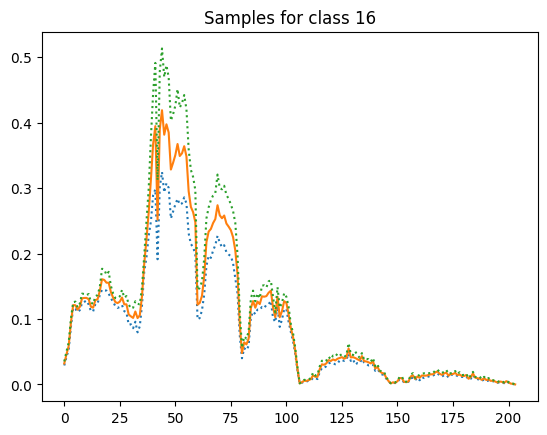

 88%|████████████████████████████████████████████████████████████████▏        | 88000/100000 [5:29:13<36:26,  5.49it/s]

Iter-88000; D_loss: -0.023518195375800133; G_loss: 31.70171356201172; C_loss: 0.060198213905096054


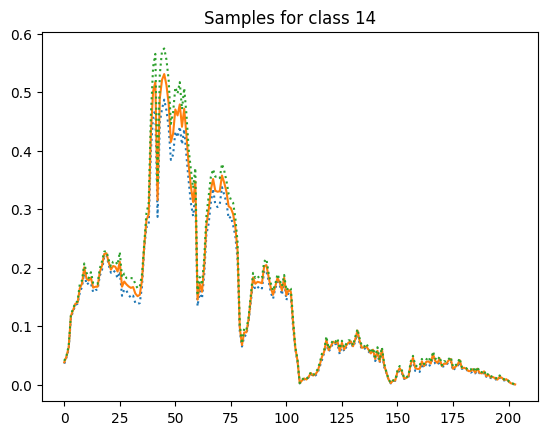

 89%|████████████████████████████████████████████████████████████████▉        | 89000/100000 [5:32:30<34:06,  5.37it/s]

Iter-89000; D_loss: -0.028396857902407646; G_loss: 31.919448852539062; C_loss: 0.006537591572850943


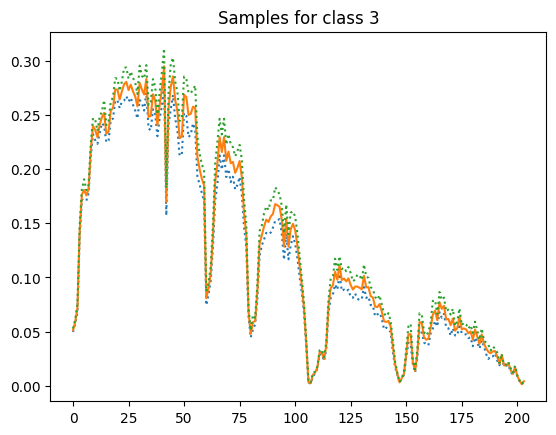

 90%|█████████████████████████████████████████████████████████████████▋       | 90000/100000 [5:35:53<31:33,  5.28it/s]

Iter-90000; D_loss: -0.01347356103360653; G_loss: 32.201629638671875; C_loss: 0.005956509616225958


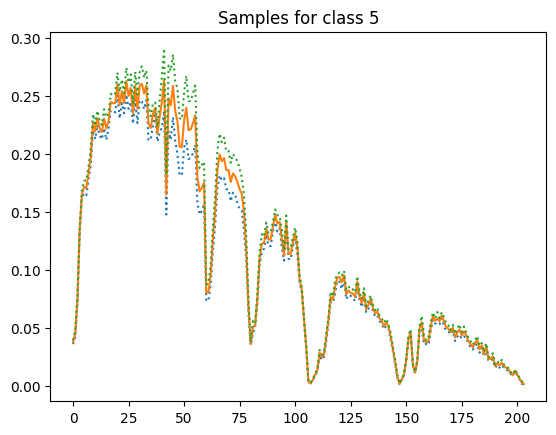

 91%|██████████████████████████████████████████████████████████████████▍      | 91000/100000 [5:39:03<26:07,  5.74it/s]

Iter-91000; D_loss: 0.001049577258527279; G_loss: 32.03838348388672; C_loss: 0.0067076473496854305


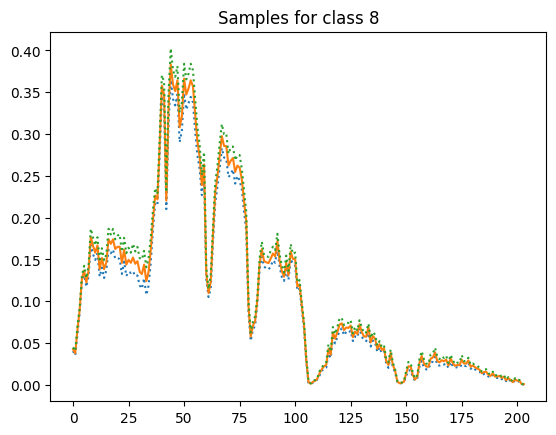

 92%|███████████████████████████████████████████████████████████████████▏     | 92000/100000 [5:42:17<24:58,  5.34it/s]

Iter-92000; D_loss: -0.02867073565721512; G_loss: 32.450767517089844; C_loss: 0.008260484784841537


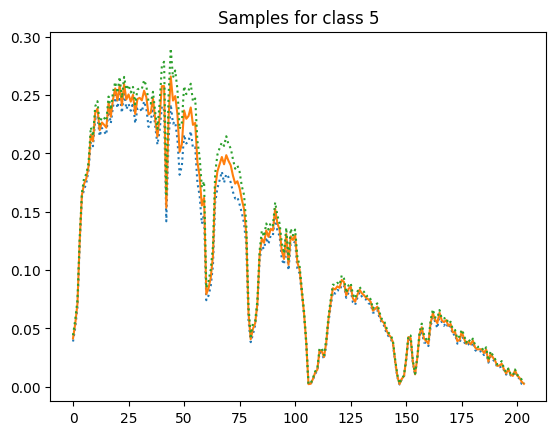

 93%|███████████████████████████████████████████████████████████████████▉     | 93000/100000 [5:45:27<22:03,  5.29it/s]

Iter-93000; D_loss: -0.019503211602568626; G_loss: 32.728309631347656; C_loss: 0.003175743157044053


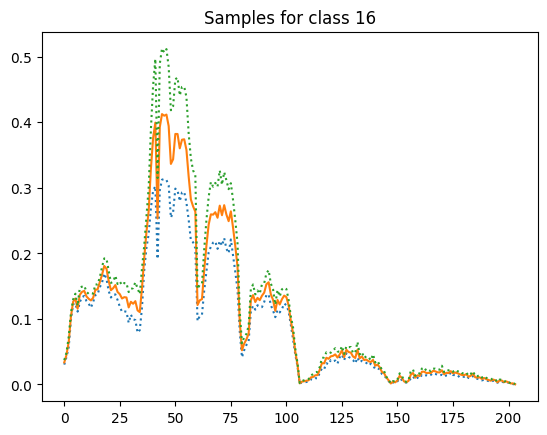

 94%|████████████████████████████████████████████████████████████████████▌    | 94000/100000 [5:48:38<19:22,  5.16it/s]

Iter-94000; D_loss: -0.04839296638965607; G_loss: 33.029598236083984; C_loss: 0.009558743797242641


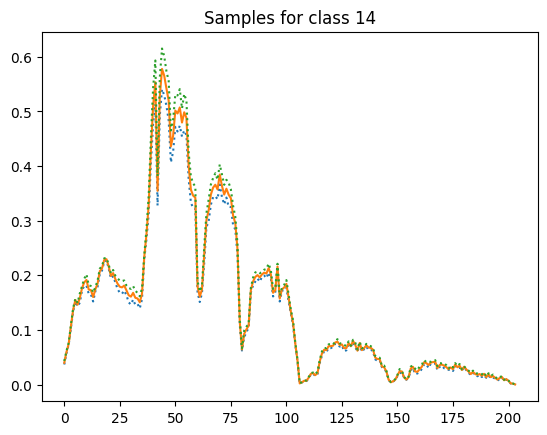

 95%|█████████████████████████████████████████████████████████████████████▎   | 95000/100000 [5:51:49<15:00,  5.55it/s]

Iter-95000; D_loss: -0.043444328010082245; G_loss: 33.24786376953125; C_loss: 0.024430692195892334


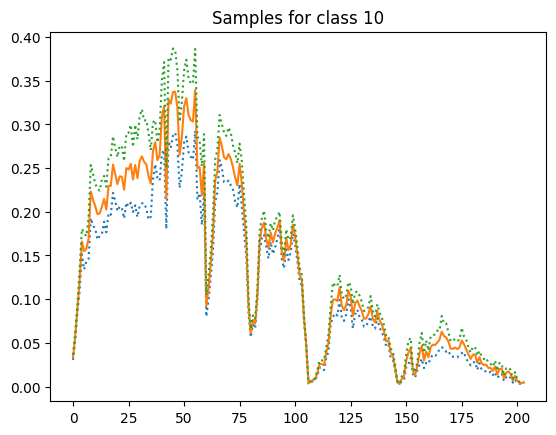

 96%|██████████████████████████████████████████████████████████████████████   | 96000/100000 [5:54:59<13:05,  5.10it/s]

Iter-96000; D_loss: -0.04468657821416855; G_loss: 33.402400970458984; C_loss: 0.005039427895098925


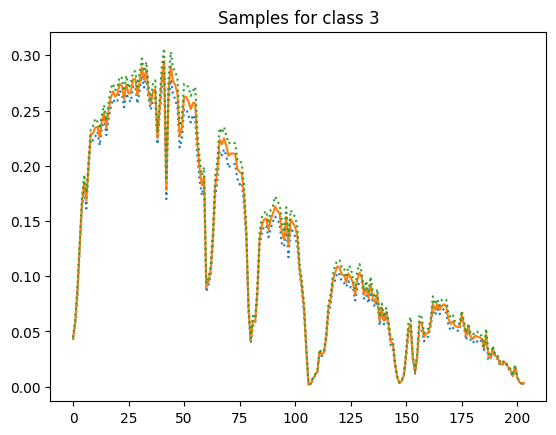

 97%|██████████████████████████████████████████████████████████████████████▊  | 97000/100000 [5:58:13<09:13,  5.42it/s]

Iter-97000; D_loss: -0.04236237332224846; G_loss: 33.38581848144531; C_loss: 0.008702436462044716


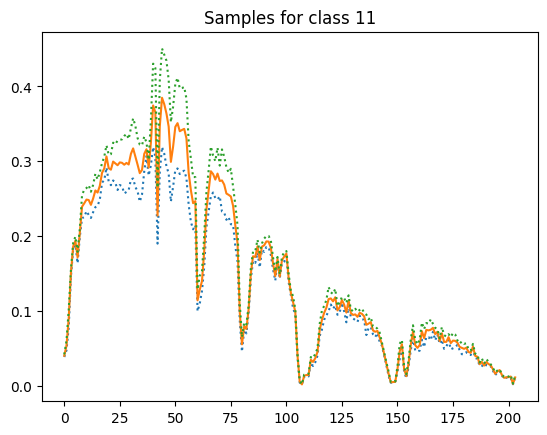

 98%|███████████████████████████████████████████████████████████████████████▌ | 98000/100000 [6:01:32<06:54,  4.83it/s]

Iter-98000; D_loss: -0.01418396644294262; G_loss: 33.509246826171875; C_loss: 0.4142858386039734


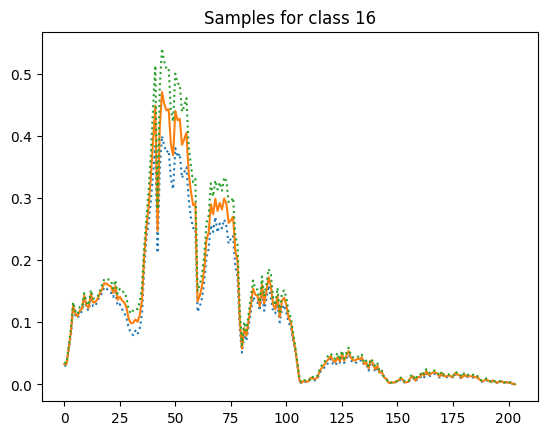

 99%|████████████████████████████████████████████████████████████████████████▎| 99000/100000 [6:04:50<03:08,  5.29it/s]

Iter-99000; D_loss: -0.01926969178020954; G_loss: 33.54718017578125; C_loss: 0.006755511276423931


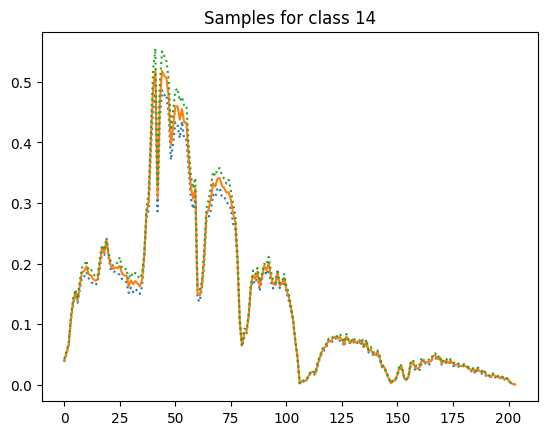

100%|████████████████████████████████████████████████████████████████████████| 100000/100000 [6:08:03<00:00,  4.53it/s]


In [9]:
import torch.optim as optim
# Get networks
G = Generator().cuda()
D = Discriminator().cuda()
C = Classifier().cuda()
# Use RMSProp optimizer
G_solver = optim.RMSprop(G.parameters(), lr=lr)
D_solver = optim.RMSprop(D.parameters(), lr=lr)
C_solver = optim.RMSprop(C.parameters(), lr=lr)

for it in tqdm(range(100000)):
    ###########################
    # (1) Update C and D      #
    ###########################
    for p in D.parameters():  # reset requires_grad
        p.requires_grad = True  # they are set to False below in netG update
    for p in C.parameters():
        p.requires_grad = True
    
    # D is trained d_step times for each iteration
    for _, (X, y), (X_, y_) in zip(range(d_step), data_loader, data_loader):
        D.zero_grad()

        # Sample random noise
        z = torch.randn(y.size(0), z_dim).squeeze()
        X, y = X.float(), y.float()
        X_, y_ = X_.float(), y_.float()
        # Mixup
        lam = np.random.beta(mixup_alpha, mixup_alpha)
        X = lam*X + (1. - lam)*X_
        X, y, z = X.cuda(), y.cuda(), z.cuda()
        y_ = y_.cuda()
        
        # Get discriminator prediction on real samples
        D_real = D(X).mean()
        # Get discriminator prediction on fake samples
        fake_samples = G(z, y)
        D_fake = D(fake_samples).mean()
        # Compute gradient penalty
        gradient_penalty = calc_gradient_penalty(D, X.data, fake_samples.data)
        # Compute loss and backpropagate
        D_loss = D_fake - D_real + gradient_penalty
        flip = np.random.random() < flip_percentage
        if flip: 
            # Flip real and fake
            gradient_penalty = calc_gradient_penalty(D, fake_samples.data, X.data)
            D_loss = D_real - D_fake + gradient_penalty
        D_loss.backward()
        D_solver.step()
    
        ######################
        #  Update C network  #
        ######################
        C.zero_grad()
        # Get class values
        _, classes = torch.max(y, dim=1)
        _, classes_ = torch.max(y_, dim=1)
        # Get predictions from C
        if flip:
            fake_samples = G(z, y)
            pred = C(fake_samples)
            # Compute loss and backpropagate
            C_loss = F.cross_entropy(pred, classes, weight=class_weights)
        else:
            pred = F.log_softmax(C(X))
            C_loss = lam * F.nll_loss(pred, classes) + (1. - lam) * F.nll_loss(pred, classes_)
        C_loss.backward()
        C_solver.step()


    ############################
    # (2) Update G network
    ###########################
    for p in D.parameters():
        p.requires_grad = False  # to avoid computation
    for p in C.parameters():
        p.requires_grad = False
    reset_grad(C, G, D)

    # Sample random noise
    z = torch.randn(y.size(0), z_dim).squeeze()
    z = z.cuda()
    # Generate fake samples
    G_sample = G(z, y)
    D_fake = D(G_sample)
    pred = C(G_sample)
    C_loss = F.cross_entropy(pred, classes, weight=class_weights)
    # Fool the discriminator (WGAN)
    G_loss = -torch.mean(D_fake)
    # Include the auxialiary classifier loss (AC-GAN)
    loss = G_loss + c_weight * C_loss
    # Backpropagate
    loss.backward()
    G_solver.step()

    # Print and plot every now and then
    if it % 1000 == 0:
        with torch.no_grad():
            print('Iter-{}; D_loss: {}; G_loss: {}; C_loss: {}'.format(it,
                                                           D_loss.data.cpu().numpy(), G_loss.data.cpu().numpy(),
                                                           C_loss.data.cpu().numpy()))
            z = torch.randn(mb_size, z_dim).squeeze().cuda()
            c = np.zeros(shape=[mb_size, c_dim], dtype='float32')
            idx = np.random.randint(1, data_loader.dataset.n_classes)
            c[:, idx] = 1.
            c = torch.from_numpy(c).squeeze().cuda()
            samples = G(z, c).data.cpu().numpy()[:16]
            pred = G(z, c)
            plot_mean_std(samples)
            plt.title("Samples for class {}".format(idx))
            plt.show()


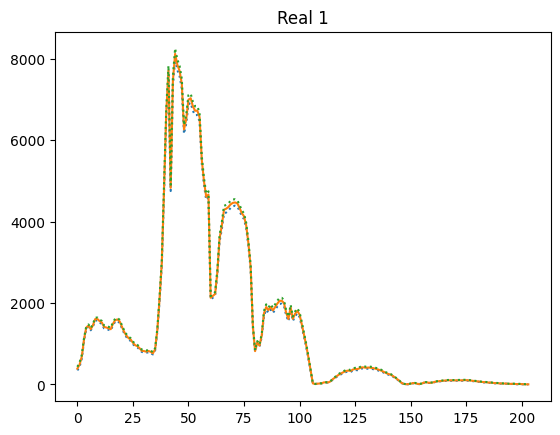

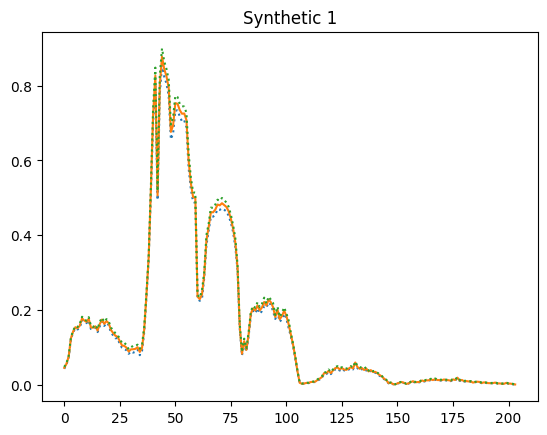

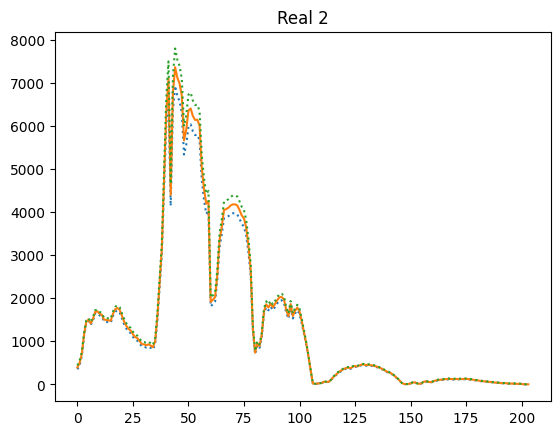

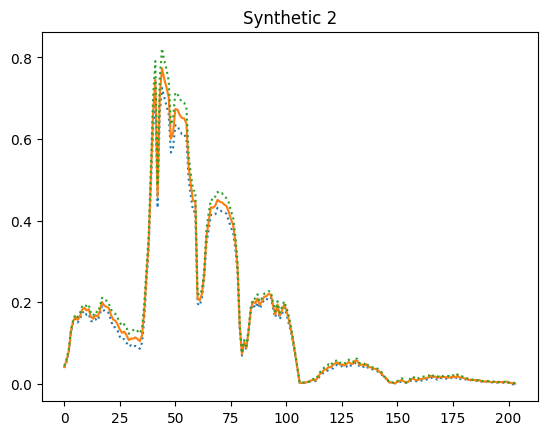

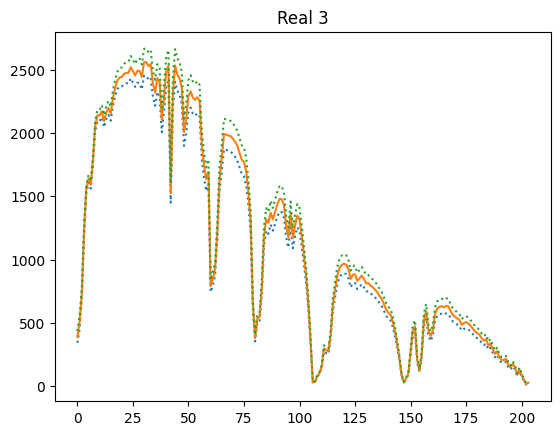

...

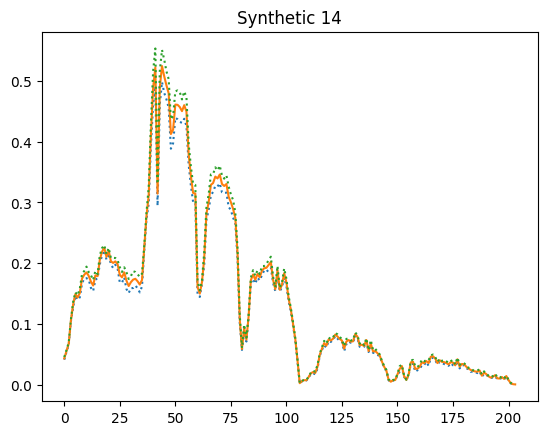

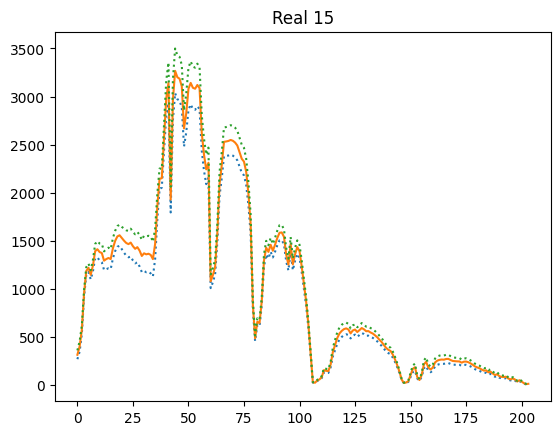

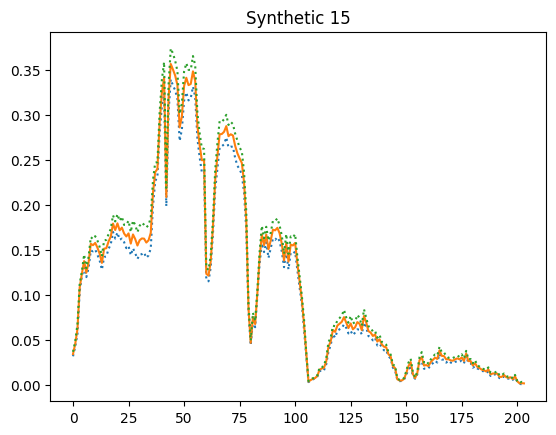

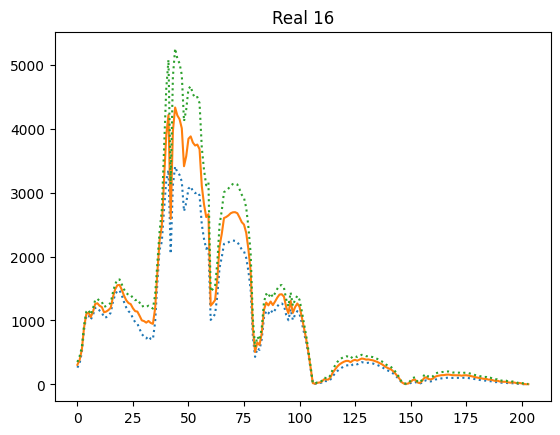

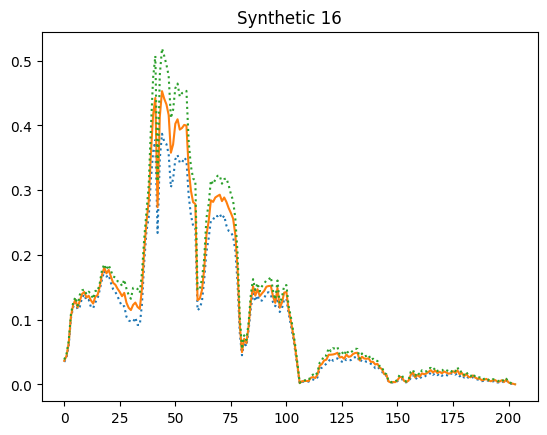

In [10]:
for c in np.unique(gt):
    # 0 is the "undefined" class
    if c == 0:
        continue
    
    # Get the mean spectrum +- std for this class
    spectras = img[gt == c, :]
    plot_mean_std(spectras)
    plt.title("Real {}".format(c))
    plt.show()
    
    # Get as many fake spectras as real ones
    synthetic_spectras = []
    with torch.no_grad():
        while len(synthetic_spectras) < len(spectras):
            z = torch.randn(mb_size, z_dim).cuda()
            y = torch.from_numpy(np.eye(data_loader.dataset.n_classes)[c]).float()
            y = y.unsqueeze(0).repeat(mb_size, 1).cuda()
            G_sample = G(z, y)
            _, classes = torch.max(y, 1)
            _, pred = torch.max(C(G_sample), 1)
            synthetic_spectras += list(G_sample.cpu().data.numpy())
    plt.show()
    plot_mean_std(synthetic_spectras)
    plt.title("Synthetic {}".format(c))
    plt.show()

In [11]:
import sklearn.svm
import sklearn.model_selection
import sklearn.preprocessing
import sklearn.pipeline
import sklearn.mixture

In [12]:
img = (img - img.min()) / (img.max() - img.min())
X_train = np.array([img[x,y] for x,y in zip(*np.nonzero(train_gt))])
y_train = np.array([gt[x,y] for x,y in zip(*np.nonzero(train_gt))])
X_test = np.array([img[x,y] for x,y in zip(*np.nonzero(test_gt))])
y_test = np.array([test_gt[x,y] for x,y in zip(*np.nonzero(test_gt))])

In [13]:
gmms = [sklearn.mixture.GaussianMixture(n_components=20) for _ in range(c_dim)]
for y in np.unique(y_train):
    gmms[y].fit(X_train[y_train == y])

In [14]:
def gmm_create_fake_dataset(gmms, y):
    fake_X = []
    y_fake = []
    for y in np.unique(y):
        n_samples = np.count_nonzero(y_test == y)
        samples = gmms[y].sample(n_samples)[0]
        fake_X.append(samples)
        y_fake += [y] * n_samples
    fake_X = np.concatenate(fake_X)
    y_fake = np.array(y_fake)
    return fake_X, y_fake

#fake_X_train, fake_y_train = gmm_create_fake_dataset(gmms, y_train)
#fake_X_test, fake_y_test = gmm_create_fake_dataset(gmms, y_test)

In [15]:
scaler = sklearn.preprocessing.StandardScaler()
svm = sklearn.svm.SVC()
#estimator = sklearn.pipeline.Pipeline(steps=[('scaler', scaler), ('svm', svm)])
estimator = sklearn.pipeline.Pipeline(steps=[('svm', svm)])
#tuned_parameters = {'svm__C': [0.1, 1, 10, 100, 1000], 'svm__kernel': ['linear']}
tuned_parameters = {'svm__C': [1000], 'svm__kernel': ['linear']}
clf = sklearn.model_selection.GridSearchCV(estimator, tuned_parameters, cv=5, n_jobs=4)
clf.fit(X_train, y_train)
score = clf.score(X_test, y_test)
best_params = clf.best_params_
print("The best SVM was obtained using {} and performed at {:.2f} accuracy.".format(best_params, 100 * score))

The best SVM was obtained using {'svm__C': 1000, 'svm__kernel': 'linear'} and performed at 92.45 accuracy.


In [16]:
y_pred = clf.predict(X_test)
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       1.00      0.99      1.00      1910
           2       0.99      0.99      0.99      3549
           3       0.97      1.00      0.99      1850
           4       0.99      0.99      0.99      1326
           5       0.99      0.98      0.99      2555
           6       1.00      1.00      1.00      3783
           7       0.99      1.00      1.00      3412
           8       0.79      0.91      0.85     10743
           9       0.99      1.00      0.99      5862
          10       0.94      0.96      0.95      3092
          11       0.97      0.99      0.98      1011
          12       1.00      1.00      1.00      1830
          13       1.00      1.00      1.00       865
          14       0.98      0.97      0.98      1011
          15       0.83      0.63      0.72      6924
          16       0.99      0.99      0.99      1704

    accuracy                           0.92     51427
   macro avg       0.96   

In [17]:
def gan_create_fake_dataset(labels):
    with torch.no_grad():
        spectras = []
        for l in np.array_split(labels, len(labels) // mb_size):
            z = torch.randn(len(l), z_dim).cuda()
            y = np.zeros((len(l), data_loader.dataset.n_classes))
            for i, label in enumerate(l):
                y[i] = np.eye(data_loader.dataset.n_classes)[label]
            y = torch.from_numpy(y).float()
            eps = torch.randn(y.size())/10
            #y += eps
            y = y.cuda()
            G_sample = G(z, y)
            spectras += list(G_sample.cpu().data.numpy())
        return np.array(spectras), np.array(labels)

In [18]:
fake_X_train, fake_y_train = gan_create_fake_dataset(y_train)
fake_X_test, fake_y_test = gan_create_fake_dataset(y_test)

In [19]:
clf.score(fake_X_test, fake_y_test)

0.9595154296381279

In [20]:
y_fake_pred = clf.predict(fake_X_test)
from sklearn.metrics import classification_report
print(classification_report(fake_y_test, y_fake_pred))

              precision    recall  f1-score   support

           1       1.00      0.89      0.94      1910
           2       0.94      0.99      0.97      3549
           3       0.80      0.99      0.88      1850
           4       1.00      0.94      0.97      1326
           5       0.98      0.98      0.98      2555
           6       1.00      1.00      1.00      3783
           7       1.00      1.00      1.00      3412
           8       0.99      0.96      0.98     10743
           9       1.00      0.98      0.99      5862
          10       0.80      0.96      0.87      3092
          11       1.00      0.06      0.11      1011
          12       1.00      0.98      0.99      1830
          13       0.99      1.00      0.99       865
          14       0.95      0.99      0.97      1011
          15       0.95      0.99      0.97      6924
          16       0.96      0.99      0.97      1704

    accuracy                           0.96     51427
   macro avg       0.96   

In [21]:
svm_fake = sklearn.svm.SVC()
clf_fake = sklearn.pipeline.Pipeline(steps=[('svm', svm_fake)])
clf_fake.set_params(**clf.best_params_)
clf_fake.fit(np.concatenate([fake_X_train]), np.concatenate([fake_y_train]))

Pipeline(steps=[('svm', SVC(C=1000, kernel='linear'))])

In [22]:
clf_fake.score(fake_X_test, fake_y_test)

0.9996499893052287

In [23]:
clf_fake.score(X_test, y_test)

0.860656853403854

In [24]:
svm_augmented = sklearn.svm.SVC()
#clf_augmented = sklearn.pipeline.Pipeline(steps=[('scaler', scaler), ('svm', svm_augmented)])
clf_augmented = sklearn.pipeline.Pipeline(steps=[('svm', svm_augmented)])
clf_augmented.set_params(**clf.best_params_)
clf_augmented.fit(np.concatenate([X_train, fake_X_train]), np.concatenate([y_train, fake_y_train]))

Pipeline(steps=[('svm', SVC(C=1000, kernel='linear'))])

In [25]:
clf_augmented.score(X_test, y_test)

0.9243782448908161

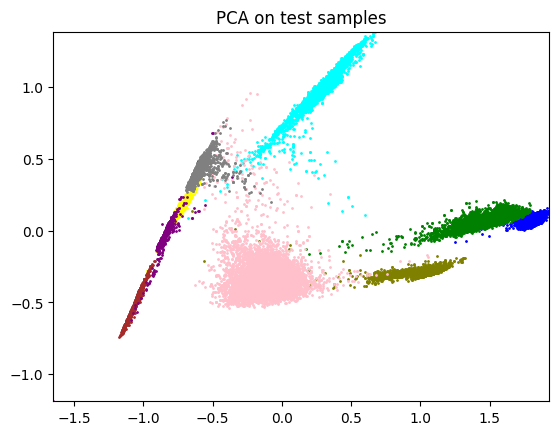

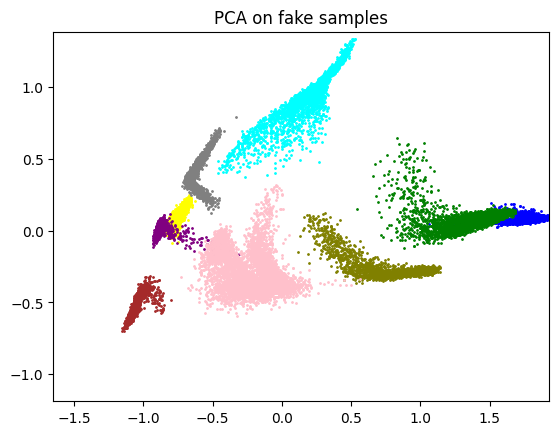

In [26]:
%matplotlib inline
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_test)
x_min, x_max = np.min(X_pca[:,0]), np.max(X_pca[:,0])
y_min, y_max = np.min(X_pca[:,1]), np.max(X_pca[:,1])

colors = ['red', 'blue', 'green', 'yellow', 'brown', 'purple', 'cyan', 'olive', 'pink', 'gray']
for i, color in enumerate(colors):
    idx = y_test == i
    plt.scatter(X_pca[idx, 0], X_pca[idx, 1], c=color, s=1)
    plt.ylim(y_min, y_max)
    plt.xlim(x_min, x_max)
    plt.title('PCA on test samples')
plt.show()

X_fake_pca = pca.transform(fake_X_test)
for i, color in enumerate(colors):
    idx = fake_y_test == i
    plt.scatter(X_fake_pca[idx, 0], X_fake_pca[idx, 1], s=1, c=color)
    plt.ylim(y_min, y_max)
    plt.xlim(x_min, x_max)
    plt.title('PCA on fake samples')
plt.show()

In [27]:
def train(net, X_train, y_train, epochs=100):
    dataset = torch.utils.data.TensorDataset(torch.from_numpy(X_train).float(),
                                             torch.from_numpy(y_train).long())
    loader = torch.utils.data.DataLoader(dataset, batch_size=1024, shuffle=True)
    solver = optim.Adam(net.parameters(), amsgrad=True)
    net.train()
    it = 0
    losses = []
    for _ in tqdm(range(epochs)):
        for X, y in loader:
            it += 1
            net.zero_grad()
            X, y = X.cuda(), y.cuda()
            out = net(X)
            loss = F.cross_entropy(out, y)
            loss.backward()
            solver.step()
            losses.append(loss.item())
            if it % 10000 == 0:
                print("Loss at {} = {}".format(it, loss.item()))
                plt.plot(losses) and plt.show()
    return net

 22%|█████████████████                                                            | 3333/15000 [03:10<09:38, 20.18it/s]

Loss at 10000 = 0.06254221498966217


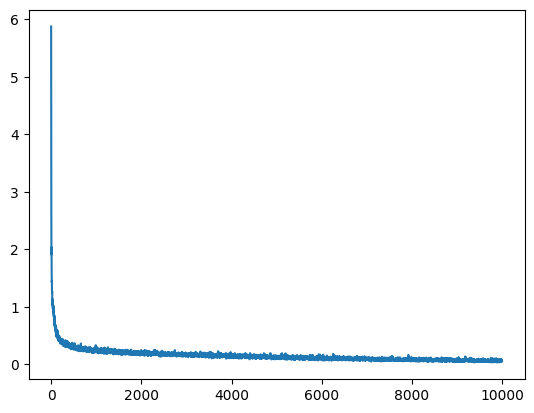

 44%|██████████████████████████████████▏                                          | 6664/15000 [06:04<06:39, 20.87it/s]

Loss at 20000 = 0.0175863616168499


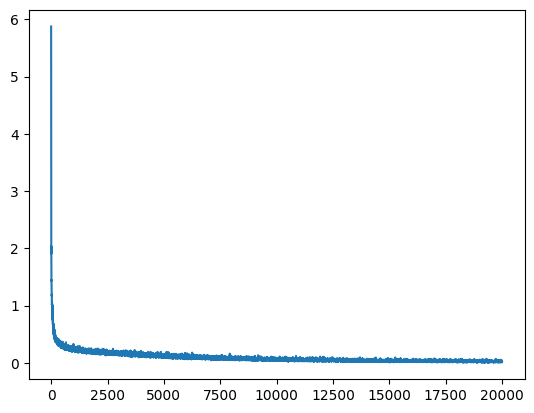

 67%|███████████████████████████████████████████████████▎                         | 9998/15000 [08:57<04:12, 19.80it/s]

Loss at 30000 = 0.02509019710123539


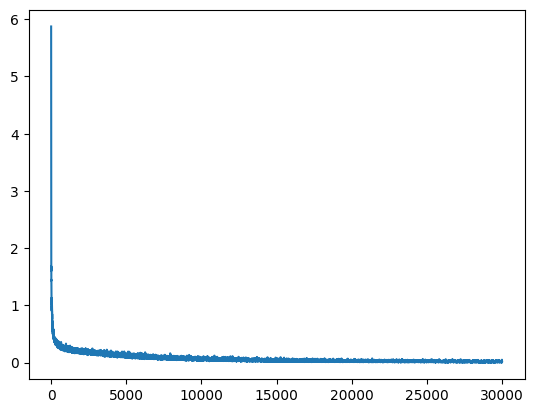

 89%|███████████████████████████████████████████████████████████████████▌        | 13332/15000 [11:57<01:25, 19.47it/s]

Loss at 40000 = 0.01042105071246624


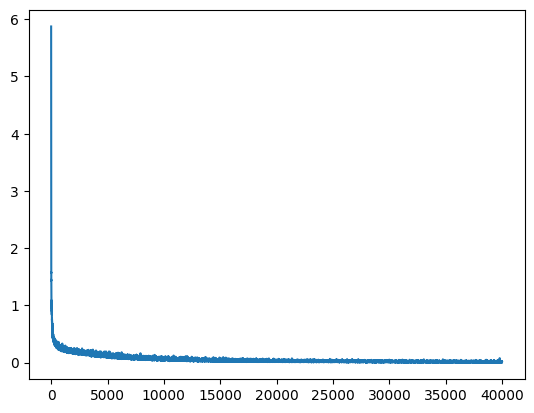

100%|████████████████████████████████████████████████████████████████████████████| 15000/15000 [13:22<00:00, 18.69it/s]


In [28]:
C_real = train(Classifier().cuda(), X_train, y_train, epochs=15000)

In [29]:
def test(net, X_test, y_test):
    with torch.no_grad():
        net.eval()
        print(X_test.shape)
        print(y_test.shape)
        dataset = torch.utils.data.TensorDataset(torch.from_numpy(X_test).float(),
                                                 torch.from_numpy(y_test).long())
        loader = torch.utils.data.DataLoader(dataset, batch_size=mb_size)
        pred = []
        for X, y in loader:
            X, y = X.cuda(), y.cuda()
            out = net(X)
            _, out = torch.max(out, 1)
            pred.append(out.cpu().numpy())
        pred = np.concatenate(pred)
        print(classification_report(y_test, pred, digits=4))
    return pred

In [30]:
test(C_real, X_test, y_test)

(51427, 204)
(51427,)
              precision    recall  f1-score   support

           1     0.9957    0.9812    0.9884      1910
           2     0.9883    0.9989    0.9936      3549
           3     0.9714    0.9897    0.9805      1850
           4     0.9910    0.9947    0.9928      1326
           5     0.9837    0.9906    0.9871      2555
           6     0.9958    0.9981    0.9970      3783
           7     0.9942    0.9997    0.9969      3412
           8     0.8177    0.7814    0.7991     10743
           9     0.9904    0.9986    0.9945      5862
          10     0.9494    0.9402    0.9448      3092
          11     0.9059    0.9327    0.9191      1011
          12     0.9765    0.9973    0.9868      1830
          13     1.0000    0.9896    0.9948       865
          14     0.9821    0.9792    0.9807      1011
          15     0.6932    0.7237    0.7081      6924
          16     0.9894    0.9888    0.9891      1704

    accuracy                         0.9091     51427
   m

array([ 6,  6,  6, ..., 16, 16, 16], dtype=int64)

 11%|████████▌                                                                    | 1666/15000 [02:53<23:10,  9.59it/s]

Loss at 10000 = 0.05768551677465439


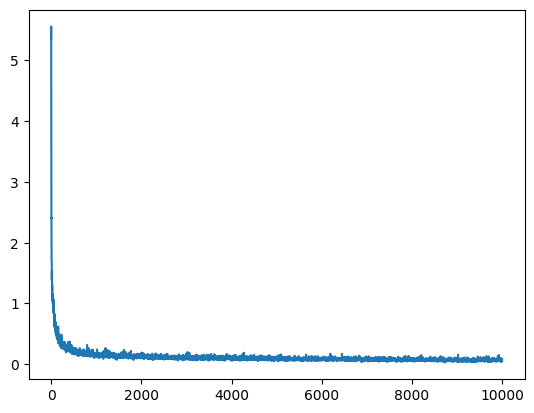

 22%|█████████████████                                                            | 3333/15000 [05:44<19:04, 10.19it/s]

Loss at 20000 = 0.05818789452314377


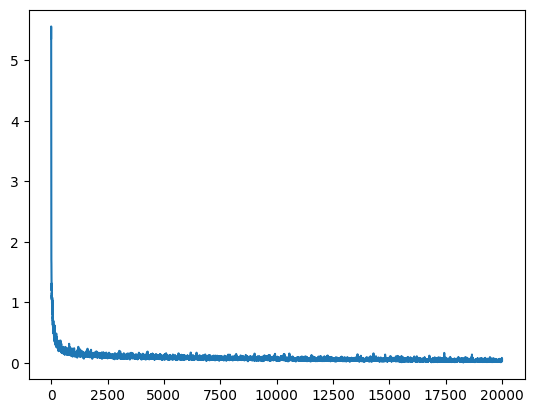

 33%|█████████████████████████▋                                                   | 4998/15000 [08:36<16:19, 10.21it/s]

Loss at 30000 = 0.02495954930782318


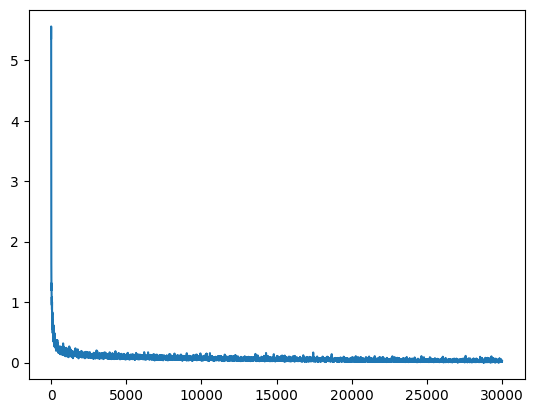

 44%|██████████████████████████████████▏                                          | 6666/15000 [11:30<13:42, 10.13it/s]

Loss at 40000 = 0.011519204825162888


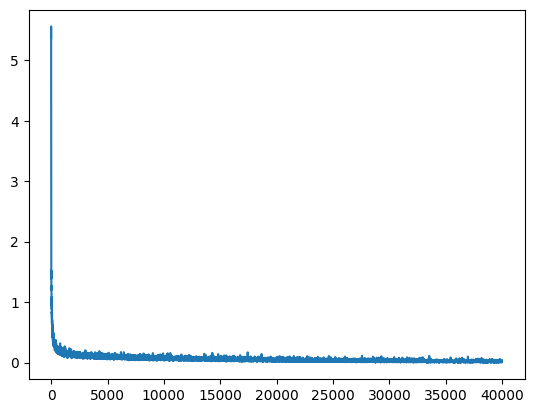

 56%|██████████████████████████████████████████▊                                  | 8332/15000 [14:35<13:52,  8.01it/s]

Loss at 50000 = 0.01432335376739502


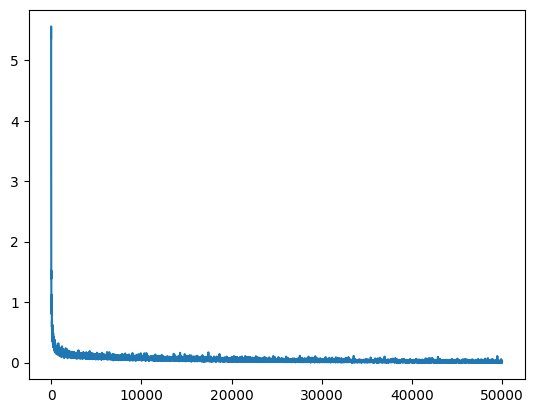

 67%|███████████████████████████████████████████████████▎                         | 9999/15000 [17:27<08:40,  9.60it/s]

Loss at 60000 = 0.0037249259185045958


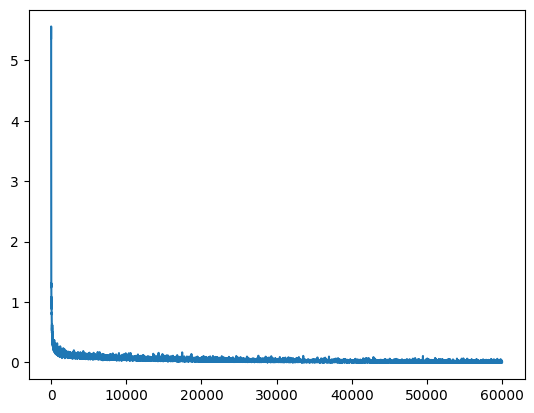

 78%|███████████████████████████████████████████████████████████                 | 11665/15000 [20:23<05:48,  9.57it/s]

Loss at 70000 = 0.005021156743168831


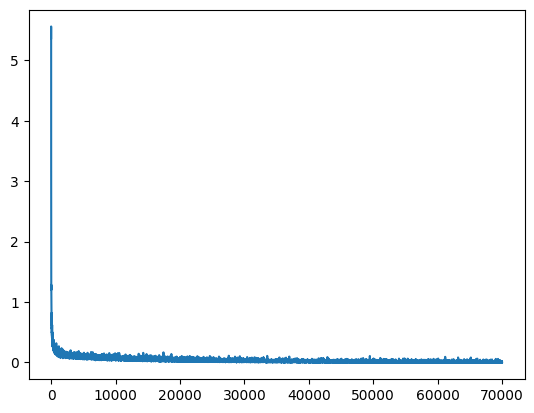

 89%|███████████████████████████████████████████████████████████████████▌        | 13332/15000 [23:16<02:35, 10.73it/s]

Loss at 80000 = 0.004678716417402029


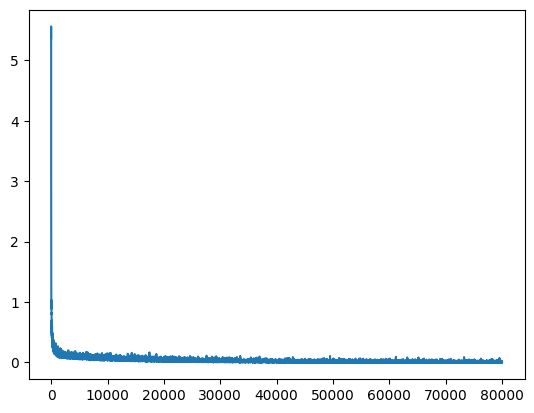

 99%|███████████████████████████████████████████████████████████████████████████▎| 14860/15000 [25:55<00:15,  9.00it/s]

In [ ]:
C_fake = train(Classifier().cuda(), np.concatenate((X_train, fake_X_train)), np.concatenate((y_train, fake_y_train)), epochs=15000)

In [ ]:
test(C_fake, X_test, y_test)